# Evaluate Unit-wget model over MPI and Era

This notebook evaluates different CNN autoencoder models on things like 1) monthly averages and 2) climate. The selected model tries to bias correct Mpi to Era and Era to MPI.

### TOC
 [1. Model Select](#ms)<br>
 [2. Load data](#ld)<br>
 [3. Month averages](#ma)<br>
 [4. Single day bias](#sd)<br>
 [5. Single filter activations](#sfa)<br>
 [6. Quantile plots](#qp)<br>
 





In [1]:
from IPython import display

import numpy as np
import torch
from torch import nn
bce = nn.BCELoss()
from torch.optim import Adam
from torch.autograd import Variable

import cv2
#from skimage.metrics import structural_similarity as ssim
import copy


In [2]:
# load netcdf files directly via xarray
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy


In [124]:
from torch import nn
mse = nn.MSELoss()

In [3]:
# define internal pic res
ires = 64
res = 64
nvars = 18
mnvars = 18


In [4]:
 mnvars

18

<a id='ms'></a>
## Models: run one from below:


In [5]:
import torch.nn.functional as F

In [6]:
class Conv2dBlock(nn.Module):
    def __init__(self, input_dim, output_dim, kernel_size, stride,
                 padding=0, norm='none', activation='relu', pad_type='zero'):
        super(Conv2dBlock, self).__init__()
        self.use_bias = True
        # initialize padding
        if pad_type == 'reflect':
            self.pad = nn.ReflectionPad2d(padding)
        elif pad_type == 'replicate':
            self.pad = nn.ReplicationPad2d(padding)
        elif pad_type == 'zero':
            self.pad = nn.ZeroPad2d(padding)
        elif pad_type == 'lonwrap':
            self.pad = LatLonPad(padding, lon_dim=-1)
        else:
            assert 0, "Unsupported padding type: {}".format(pad_type)

        # initialize normalization
        norm_dim = output_dim
        if norm == 'bn':
            self.norm = nn.BatchNorm2d(norm_dim)
        elif norm == 'in':
            #self.norm = nn.InstanceNorm2d(norm_dim, track_running_stats=True)
            self.norm = nn.InstanceNorm2d(norm_dim)
        elif norm == 'ln':
            self.norm = LayerNorm(norm_dim)
        elif norm == 'adain':
            self.norm = AdaptiveInstanceNorm2d(norm_dim)
        elif norm == 'none':
            self.norm = None
        else:
            assert 0, "Unsupported normalization: {}".format(norm)

        self.activation = MultiChannelActivation(activation, output_dim)

        # initialize convolution
        self.conv = nn.Conv2d(input_dim, output_dim, kernel_size, stride, bias=self.use_bias)

    def forward(self, x):
        #print("x", x)
        #print("SHAPE1 x", x.shape)
        x = self.conv(self.pad(x))
        if self.norm:
            x = self.norm(x)
        if self.activation:
            x = self.activation(x)
        return x


class Encoder(nn.Module):
    def __init__(self, n_downsample, n_res, input_dim, dim, norm, activ, pad_type):
        super(Encoder, self).__init__()
        #input_dim, output_dim, kernel_size, stride, padding
        # This layer conserves lat-lon
        self.model = [Conv2dBlock(input_dim, dim, 7, 1, 3, norm=norm, activation=activ, pad_type=pad_type)]
        # downsampling blocks
        for i in range(n_downsample):
            # This layer coarsens lat-lon by factor 2
            self.model += [
                Conv2dBlock(dim, 2*dim,
                            kernel_size=4, stride=2, padding=1,
                            norm=norm, activation=activ, pad_type=pad_type)
            ]
            # residual blocks maintain lat-lon shape
            if n_res>0:
                self.model += [ResBlocks(n_res, 2*dim, norm='none', activation=activ, pad_type=pad_type)]
            dim *= 2

        self.model = nn.Sequential(*self.model)
        self.output_dim = dim

    def forward(self, x):
        return self.model(x)

class Decoder(nn.Module):
    def __init__(self, n_upsample, n_res, dim, output_dim, norm,
                 activ='relu', pad_type='zero', output_activ='none', upsample='nearest'):
        super(Decoder, self).__init__()

        if upsample=='nearest':
            def _decode_upsampler(C): return nn.Upsample(scale_factor=2, mode='nearest')
        elif upsample=='bilinear':
            def _decode_upsampler(C): return nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        elif upsample=='conv':
            def _decode_upsampler(C): return nn.ConvTranspose2d(C, C, kernel_size=2, stride=2)
        else:
            assert 0, "`upsample` must be one of ['nearest', 'bilinear', 'conv']"

        self.model = []
        # residual blocks
        if n_res>0:
            self.model += [ResBlocks(n_res, dim, norm, activ, pad_type=pad_type)]
        # upsampling blocks
        for i in range(n_upsample):
            self.model += [_decode_upsampler(dim)]
            self.model += [Conv2dBlock(dim, dim//2, 5, 1, 2,
                                       norm=norm, activation=activ, pad_type=pad_type)]
            if n_res>0:
                self.model += [ResBlocks(n_res, dim//2, norm='none', activation=activ, pad_type=pad_type)]
            dim //= 2

        self.model += [Conv2dBlock(dim, output_dim, 7, 1, 3, norm='none', activation=output_activ, pad_type=pad_type)]
        self.model = nn.Sequential(*self.model)


    def forward(self, x):
        return self.model(x)

def get_activation(activation):
        # initialize activation
    if activation == 'relu':
        return nn.ReLU(inplace=False)
    elif activation == '-relu':
        return NegReLU()
    elif activation == 'lrelu':
        return nn.LeakyReLU(0.2, inplace=True)
    elif activation == 'prelu':
        return nn.PReLU()
    elif activation == 'selu':
        return nn.SELU(inplace=True)
    elif activation == 'tanh':
        return nn.Tanh()
    elif activation == 'none':
        return None
    else:
        assert 0, "Unsupported activation: {}".format(activation)

    
class MultiChannelActivation(nn.Module):
    def __init__(self, activation, output_dim):
        super(MultiChannelActivation, self).__init__()
        if isinstance(activation, str):
            activation = [activation]
        elif (not isinstance(activation, list)) or len(activation)!=output_dim:
            raise ValueError(f"Not valid activation {activation} for channels {output_dim}")

        self.activation = [get_activation(a) for a in activation]

    def forward(self, x):
        if len(self.activation)==1:
            if self.activation[0] is not None:
                return self.activation[0](x)
            else:
                return x
        else:
            x_list = [self.activation[i](x[:, i:i+1]) if self.activation[i] is not None else x[:, i:i+1] for i in range(x.shape[1])]
            x = torch.cat(x_list, dim=1)
            return x

##################################################################################
# Sequential Models
##################################################################################

class ResBlocks(nn.Module):
    def __init__(self, num_blocks, dim, norm='in', activation='lrelu', pad_type='zero'):
        super(ResBlocks, self).__init__()
        self.model = []
        for i in range(num_blocks):
            self.model += [ResBlock(dim, norm=norm, activation=activation, pad_type=pad_type)]
        self.model = nn.Sequential(*self.model)

    def forward(self, x):
        return self.model(x)


##################################################################################
# Basic Blocks
##################################################################################

class ResBlock(nn.Module):
    def __init__(self, dim, norm='in', activation='lrelu', pad_type='zero'):
        super(ResBlock, self).__init__()

        model = []
        model += [Conv2dBlock(dim, dim, 3, 1, 1, norm=norm, activation=activation, pad_type=pad_type)]
        model += [Conv2dBlock(dim, dim, 3, 1, 1, norm=norm, activation=activation, pad_type=pad_type)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        residual = x
        out = residual + self.model(x)
        return out


  
    
class VAEGen(nn.Module):
    # VAE architecture
    def __init__(self, input_dim, land_mask, params):
        super(VAEGen, self).__init__()
        dim = params['dim']
        n_downsample = params['n_downsample']
        n_res = params['n_res']
        activ = params['activ']
        pad_type = params['pad_type']
        output_activ = 'none' #params['output_activ']
        upsample = 'nearest' #params['upsample']
        norm = 'bn' #params['norm']
        self.use_land_mask = land_mask is not None
        self.land_mask = nn.Parameter(land_mask, requires_grad=False)

        # content encoder
        self.enc = Encoder(n_downsample, n_res, input_dim+int(self.use_land_mask),
                                  dim, norm, activ, pad_type=pad_type)
        self.dec = Decoder(n_downsample, n_res, self.enc.output_dim, input_dim, norm=norm,
                           activ=activ, pad_type=pad_type, output_activ=output_activ,
                           upsample=upsample)

    def forward(self, images):
        # This is a reduced VAE implementation where we assume the outputs are multivariate Gaussian distribution with mean = hiddens and std_dev = all ones.
        hiddens = self.encode(images)
        if 0 and self.training:
            #print("hiddens", hiddens)
            #noise = Variable(torch.randn(hiddens.size()).cuda(hiddens.data.get_device()))
            noise = Variable(torch.randn(hiddens.size()))
            images_recon = self.decode(hiddens + noise)
        else:
            images_recon = self.decode(hiddens)
        return images_recon, hiddens

    def encode(self, images):
        if self.use_land_mask:
            images = torch.cat([images, self.land_mask.clone().detach().repeat(images.shape[0],1,1,1)], dim=1)
        hiddens = self.enc(images)
        #noise = Variable(torch.randn(hiddens.size()).cuda(hiddens.data.get_device()))
        noise = Variable(torch.randn(hiddens.size()))
        return hiddens, noise
    
    def decode(self, hiddens):
        images = self.dec(hiddens)
        return images
    
##################################################################################
# Discriminator
##################################################################################

class MsImageDis(nn.Module):
    # Multi-scale discriminator architecture
    def __init__(self, input_dim, land_mask, params):
        super(MsImageDis, self).__init__()
        self.n_layer = params['n_layer']
        self.gan_type = params['gan_type']
        self.dim = params['dim']
        self.norm = params['norm']
        self.activ = params['activ']
        self.num_scales = params['num_scales']
        self.pad_type = params['pad_type']

        self.input_dim = input_dim
        self.use_land_mask = land_mask is not None
        self.land_mask = nn.Parameter(land_mask, requires_grad=False)
        self.downsample = nn.AvgPool2d(2, stride=2, padding=0, count_include_pad=False)

        self.cnns = nn.ModuleList()
        for _ in range(self.num_scales):
            self.cnns.append(self._make_net())

    def _make_net(self):
        dim = self.dim
        cnn_x = [
            Conv2dBlock(
                (self.input_dim+int(self.use_land_mask)), dim, 7, 1, 3,
                norm='none',
                activation=self.activ,
                pad_type=self.pad_type),
            Conv2dBlock(dim, dim, 4, 2, 1,
              norm=self.norm,
              activation=self.activ,
              pad_type=self.pad_type)
        ]
        for i in range(self.n_layer  - 1):
            cnn_x += [Conv2dBlock(dim, dim * 2, 4, 2, 1,
                                  norm=self.norm,
                                  activation=self.activ,
                                  pad_type=self.pad_type)
            ]
            dim *= 2
        cnn_x += [nn.Conv2d(dim, 1, 1, 1, 0)]
        cnn_x = nn.Sequential(*cnn_x)
        return cnn_x

    def forward(self, x):
        outputs = []
        if self.use_land_mask:
            x = torch.cat([x, self.land_mask.clone().detach().repeat(x.shape[0],1,1,1)], dim=1)
        #print('SELF.CNNS', self.cnns)
        for model in self.cnns:
            #print('OIOIH', model, x)
            model.cuda()
            #x.cuda()
            #print(model(x))
            outputs.append(model(x))
            x = self.downsample(x)
        return outputs

    def calc_dis_loss(self, input_fake, input_real):
        # calculate the loss to train D
        outs0 = self.forward(input_fake)
        outs1 = self.forward(input_real)
        loss = 0

        for it, (out0, out1) in enumerate(zip(outs0, outs1)):
            if self.gan_type == 'lsgan':
                loss += torch.mean((out0 - 0)**2) + torch.mean((out1 - 1)**2)
            elif self.gan_type == 'nsgan':
                all0 = Variable(torch.zeros_like(out0.data).cuda(), requires_grad=False)
                all1 = Variable(torch.ones_like(out1.data).cuda(), requires_grad=False)
                loss += torch.mean(F.binary_cross_entropy(F.sigmoid(out0), all0) +
                                   F.binary_cross_entropy(F.sigmoid(out1), all1))
            else:
                assert 0, "Unsupported GAN type: {}".format(self.gan_type)
        return loss

    def calc_gen_loss(self, input_fake):
        # calculate the loss to train G
        outs0 = self.forward(input_fake)
        loss = 0
        for it, (out0) in enumerate(outs0):
            if self.gan_type == 'lsgan':
                loss += torch.mean((out0 - 1)**2) # LSGAN
            elif self.gan_type == 'nsgan':
                all1 = Variable(torch.ones_like(out0.data).cuda(), requires_grad=False)
                loss += torch.mean(F.binary_cross_entropy(F.sigmoid(out0), all1))
            else:
                assert 0, "Unsupported GAN type: {}".format(self.gan_type)
        return loss


    
def resume(checkpoint_dir, hyperparameters):
        # Load generators
        last_model_name = get_model_list(checkpoint_dir, "gen")
        state_dict = torch.load(last_model_name)
        gen_a.load_state_dict(state_dict['a'])
        gen_b.load_state_dict(state_dict['b'])
        iterations = int(last_model_name[-11:-3])
        # Load discriminators
        last_model_name = get_model_list(checkpoint_dir, "dis")
        state_dict = torch.load(last_model_name)
        dis_a.load_state_dict(state_dict['a'])
        dis_b.load_state_dict(state_dict['b'])
        # Load optimizers
        state_dict = torch.load(os.path.join(checkpoint_dir, 'optimizer.pt'))
        dis_opt.load_state_dict(state_dict['dis'])
        gen_opt.load_state_dict(state_dict['gen'])
        ## Reinitilize schedulers
        #dis_scheduler = get_scheduler(dis_opt, hyperparameters, iterations)
        #gen_scheduler = get_scheduler(gen_opt, hyperparameters, iterations)
        print('Resume from iteration %d' % iterations)
        return iterations


# # Config
# #import yaml
# #with open('hadgem3_to_cam5_nat-hist-4channels.yaml', 'r') as stream:
# #        config = yaml.load(stream)
# gen = {'dim': 64, 'mlp_dim': 256, 'style_dim': 8, 'activ': 'relu', 'n_downsample': 2, 'n_res': 4, 'pad_type': 'zero'}
# dis = {'dim': 64, 'norm': 'none', 'activ': 'lrelu', 'n_layer': 4, 'gan_type': 'lsgan', 'num_scales': 3, 'pad_type': 'reflect'}



# # load generator
# gen_a = VAEGen(64, None, gen) 
# gen_b = VAEGen(64, None, gen) 
# state_dict = torch.load('/glade/scratch/dkorytin/delme/gen_00945001.pt', map_location=torch.device('cpu'))
# gen_a.load_state_dict(state_dict['a'])
# gen_b.load_state_dict(state_dict['b'])

# # load discriminator
# state_dict = torch.load('/glade/scratch/dkorytin/delme/dis_00945001.pt', map_location=torch.device('cpu'))
# dis_a = MsImageDis(64, None, dis)  # discriminator for domain a
# dis_a.load_state_dict(state_dict['a'])

In [118]:
# 64x64 net
gen = {'dim': 64, 'mlp_dim': 2048, 'style_dim': 8, 'activ': 'relu', 'n_downsample': 3, 'n_res': 4, 'pad_type': 'zero', 'upsample': 'conv'}
dis = {'dim': 64, 'norm': 'bn', 'activ': 'lrelu', 'n_layer': 4, 'gan_type': 'lsgan', 'num_scales': 3, 'pad_type': 'reflect'}

# load generator
gen_a = VAEGen(18, None, gen) 
gen_b = VAEGen(18, None, gen) 
#state_dict = torch.load('/glade/scratch/dkorytin/delme/unit-wnet_ext1B_bestconfig/gen_00330001.pt', map_location=torch.device('cpu'))
state_dict = torch.load('/glade/scratch/dkorytin/delme/unit-wnet_ext1B_bestconfig/gen_00865001.pt', map_location=torch.device('cpu'))
gen_a.load_state_dict(state_dict['a'])
gen_b.load_state_dict(state_dict['b'])


<All keys matched successfully>

In [8]:
# DEEPER 64x64 net
gen = {'dim': 64, 'mlp_dim': 2048, 'style_dim': 8, 'activ': 'relu', 'n_downsample': 4, 'n_res': 4, 'pad_type': 'zero', 'upsample': 'conv'}
dis = {'dim': 64, 'norm': 'bn', 'activ': 'lrelu', 'n_layer': 4, 'gan_type': 'lsgan', 'num_scales': 3, 'pad_type': 'reflect'}

# load generator
gen_a = VAEGen(18, None, gen) 
gen_b = VAEGen(18, None, gen) 
state_dict = torch.load('/glade/scratch/dkorytin/delme/gen_00310001.pt', map_location=torch.device('cpu'))
gen_a.load_state_dict(state_dict['a'])
gen_b.load_state_dict(state_dict['b'])


RuntimeError: Error(s) in loading state_dict for VAEGen:
	Missing key(s) in state_dict: "enc.model.7.norm.weight", "enc.model.7.norm.bias", "enc.model.7.norm.running_mean", "enc.model.7.norm.running_var", "enc.model.7.conv.weight", "enc.model.7.conv.bias", "enc.model.8.model.0.model.0.conv.weight", "enc.model.8.model.0.model.0.conv.bias", "enc.model.8.model.0.model.1.conv.weight", "enc.model.8.model.0.model.1.conv.bias", "enc.model.8.model.1.model.0.conv.weight", "enc.model.8.model.1.model.0.conv.bias", "enc.model.8.model.1.model.1.conv.weight", "enc.model.8.model.1.model.1.conv.bias", "enc.model.8.model.2.model.0.conv.weight", "enc.model.8.model.2.model.0.conv.bias", "enc.model.8.model.2.model.1.conv.weight", "enc.model.8.model.2.model.1.conv.bias", "enc.model.8.model.3.model.0.conv.weight", "enc.model.8.model.3.model.0.conv.bias", "enc.model.8.model.3.model.1.conv.weight", "enc.model.8.model.3.model.1.conv.bias", "dec.model.11.norm.weight", "dec.model.11.norm.bias", "dec.model.11.norm.running_mean", "dec.model.11.norm.running_var", "dec.model.11.conv.weight", "dec.model.11.conv.bias", "dec.model.12.model.0.model.0.conv.weight", "dec.model.12.model.0.model.0.conv.bias", "dec.model.12.model.0.model.1.conv.weight", "dec.model.12.model.0.model.1.conv.bias", "dec.model.12.model.1.model.0.conv.weight", "dec.model.12.model.1.model.0.conv.bias", "dec.model.12.model.1.model.1.conv.weight", "dec.model.12.model.1.model.1.conv.bias", "dec.model.12.model.2.model.0.conv.weight", "dec.model.12.model.2.model.0.conv.bias", "dec.model.12.model.2.model.1.conv.weight", "dec.model.12.model.2.model.1.conv.bias", "dec.model.12.model.3.model.0.conv.weight", "dec.model.12.model.3.model.0.conv.bias", "dec.model.12.model.3.model.1.conv.weight", "dec.model.12.model.3.model.1.conv.bias", "dec.model.13.conv.weight", "dec.model.13.conv.bias". 
	Unexpected key(s) in state_dict: "dec.model.10.conv.weight", "dec.model.10.conv.bias". 
	size mismatch for dec.model.0.model.0.model.0.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.0.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.0.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.0.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.0.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.0.model.0.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.1.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.1.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.1.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.1.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.0.model.1.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.0.model.1.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.0.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.0.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.0.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.0.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.0.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.1.model.0.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.1.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.1.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.1.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.1.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.1.model.1.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.1.model.1.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.0.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.0.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.0.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.0.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.0.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.2.model.0.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.1.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.1.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.1.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.1.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.2.model.1.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.2.model.1.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.0.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.0.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.0.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.0.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.0.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.3.model.0.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.1.norm.weight: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.1.norm.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.1.norm.running_mean: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.1.norm.running_var: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.0.model.3.model.1.conv.weight: copying a param with shape torch.Size([512, 512, 3, 3]) from checkpoint, the shape in current model is torch.Size([1024, 1024, 3, 3]).
	size mismatch for dec.model.0.model.3.model.1.conv.bias: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for dec.model.2.norm.weight: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.2.norm.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.2.norm.running_mean: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.2.norm.running_var: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.2.conv.weight: copying a param with shape torch.Size([256, 512, 5, 5]) from checkpoint, the shape in current model is torch.Size([512, 1024, 5, 5]).
	size mismatch for dec.model.2.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.0.model.0.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.0.model.0.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.0.model.1.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.0.model.1.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.1.model.0.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.1.model.0.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.1.model.1.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.1.model.1.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.2.model.0.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.2.model.0.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.2.model.1.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.2.model.1.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.3.model.0.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.3.model.0.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.3.model.3.model.1.conv.weight: copying a param with shape torch.Size([256, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 512, 3, 3]).
	size mismatch for dec.model.3.model.3.model.1.conv.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([512]).
	size mismatch for dec.model.5.norm.weight: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.5.norm.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.5.norm.running_mean: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.5.norm.running_var: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.5.conv.weight: copying a param with shape torch.Size([128, 256, 5, 5]) from checkpoint, the shape in current model is torch.Size([256, 512, 5, 5]).
	size mismatch for dec.model.5.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.0.model.0.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.0.model.0.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.0.model.1.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.0.model.1.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.1.model.0.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.1.model.0.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.1.model.1.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.1.model.1.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.2.model.0.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.2.model.0.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.2.model.1.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.2.model.1.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.3.model.0.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.3.model.0.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.6.model.3.model.1.conv.weight: copying a param with shape torch.Size([128, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).
	size mismatch for dec.model.6.model.3.model.1.conv.bias: copying a param with shape torch.Size([128]) from checkpoint, the shape in current model is torch.Size([256]).
	size mismatch for dec.model.8.norm.weight: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.8.norm.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.8.norm.running_mean: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.8.norm.running_var: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.8.conv.weight: copying a param with shape torch.Size([64, 128, 5, 5]) from checkpoint, the shape in current model is torch.Size([128, 256, 5, 5]).
	size mismatch for dec.model.8.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.0.model.0.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.0.model.0.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.0.model.1.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.0.model.1.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.1.model.0.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.1.model.0.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.1.model.1.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.1.model.1.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.2.model.0.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.2.model.0.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.2.model.1.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.2.model.1.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.3.model.0.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.3.model.0.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).
	size mismatch for dec.model.9.model.3.model.1.conv.weight: copying a param with shape torch.Size([64, 64, 3, 3]) from checkpoint, the shape in current model is torch.Size([128, 128, 3, 3]).
	size mismatch for dec.model.9.model.3.model.1.conv.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([128]).

<a id='ld'></a>
# Load data

In [11]:
# WRF-MPI DOMAIN Ext1
samples_era = np.load('/glade/scratch/dkorytin/samples_wrferaext18_365.npy')
samples_mpi = np.load('/glade/scratch/dkorytin/samples_wrfmpiext18_365.npy')
samples_era[np.isnan(samples_era)] = 0.   # extended surface domain has nan's at bottom
samples_mpi[np.isnan(samples_mpi)] = 0.   # extended surface domain has nan's at bottom
samples_era = torch.tensor(samples_era, dtype=torch.float32)
samples_mpi = torch.tensor(samples_mpi, dtype=torch.float32)
minmaxi_era = np.load('/glade/scratch/dkorytin/minmaxi_wrferaext18.npy')
minmaxi_mpi = minmaxi_era


In [12]:
samples_era.shape

torch.Size([365, 18, 192, 256])

(192, 256)


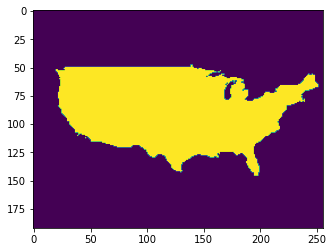

In [13]:
# gridmet as mask
tslice = slice('1979-01-01T00:00:00', '1979-01-01T20:00:00')
mask = xr.open_dataset('/glade/p/ral/risc/narccap/obs/gridMET/common/rsds.gridMET.NAM-22i.nc')['rsds'].sel(time=tslice, lat=slice(13.5,61.5), lon=slice(-130,-66))
mask.shape
mask = np.array(mask[0])
mask[mask>0] = 1
mask[np.isnan(mask)] = 0.
print(mask.shape)
plt.imshow(mask[::-1,:])

# # zero out mask borders in surface vars
# samples_mpi[:,8:,:,:] = samples_mpi[:,8:,:,:] * mask[None,None,:,:]
# samples_era[:,8:,:,:] = samples_era[:,8:,:,:] * mask[None,None,:,:]


# Plot routines

In [14]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import cartopy.feature as cfeature
import xarray as xr

# metadata used for lat/lon backdrop
tslice = slice('1979-01-01T00:00:00', '1979-01-01T20:00:00')
d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'
dv1 = xr.open_dataset('/glade/p/ral/risc/narccap/obs/gridMET/common/rsds.gridMET.NAM-22i.nc')['rsds'].sel(time=tslice, lat=slice(13.5,61.5), lon=slice(-130,-66))
    
def plot_8v_abs_192x256(isample, modelname, vmin, vmax, yoff=0, xoff=0, yz=192, xz=256, cc=True):
#     varmames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
#     units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
#     cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
        
#     fig, axarr = plt.subplots(1, 8, figsize = (20,20))
#     for ii in range(8):
#         plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
#         cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
#         cbar.set_label(units[ii])
#         axarr[ii].set_title(varmames[ii])
#     plt.suptitle(modelname, y=0.29, fontsize=16)
#     plt.show()
    varmames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'PuBuGn', 'coolwarm', 'Spectral', 'Spectral', 'PiYG', 'PuOr']

    # pass by value
    vmin = copy.deepcopy(vmin)
    vmax = copy.deepcopy(vmax)
    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))

    #vmin[6] = -max(abs(vmin[6]), abs(vmax[6]))
    #vmax[6] = max(abs(vmin[6]), abs(vmax[6]))
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))
    
    # min of Q850 should be 0
    vmin[2] = 0

          
    fig, axarr = plt.subplots(1, 8, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    lon = dv1[0].lon
    lat = dv1[0].lat

    for ii in range(8):
        
        #axarr[ii].set_title("Subplot row", fontsize=16)
        axarr[ii].coastlines()
        axarr[ii].add_feature(cfeature.STATES)
        img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
#         # add wind barbs
#         x=[]; y=[]; u=[]; v=[]
#         for mm in range(0, 128, 20):
#             hx = []
#             for nn in range(0, 128, 20): 
#                 x.append(dv1[0][mm,nn].lon)
#                 y.append(dv1[0][mm,nn].lat)
#                 #u.append(isample[11][mm,nn]) # uas
#                 #v.append(isample[12][mm,nn]) # vas
#                 u.append(isample[0][mm,nn]) # u850
#                 v.append(isample[1][mm,nn]) # v850
#         axarr[ii].barbs(x, y, u, v, length=5, sizes=dict(emptybarb=0.25, spacing=0.2, height=0.5), linewidth=0.95)

#         # add huss850 contours
#         if cc == True:
#             x=[]; y=[];
#             for mm in range(0, 192, 1):
#                 x.append(dv1[0][mm,mm].lon)
#                 y.append(dv1[0][mm,mm].lat)
#             hx=[]; hy=[]
#             for mm in range(0, 192, 1):
#                 hx = []
#                 for nn in range(0, 256, 1):
#                     #hx.append(isample[2][mm,nn]) # q850
#                     hx.append(isample[ii][mm,nn]) # q850
#                 hy.append(hx)
#             X, Y = np.meshgrid(x, y)
#             Z = np.array(hy)
#             CS = axarr[ii].contour(X, Y, Z)
#             axarr[ii].clabel(CS, inline=True, fontsize=10)


        
        plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  
        #plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
        cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
        cbar.set_label(units[ii])
        axarr[ii].set_title(varmames[ii])
        

    plt.suptitle(modelname, y=0.26, fontsize=16)
    plt.show()





In [15]:
samples_era.shape

torch.Size([365, 18, 192, 256])

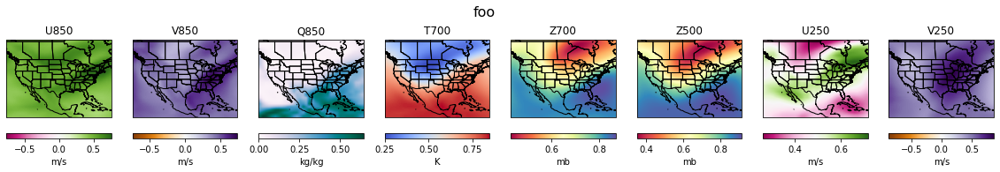

In [16]:
minmaxi_era
vmin = [samples_era[0][ii].min() for ii in range(16)]
vmax = [samples_era[0][ii].max() for ii in range(16)]

plot_8v_abs_192x256(np.array(samples_era[0]), 'foo', vmin, vmax)

In [17]:
# tslice = slice('1979-01-01T00:00:00', '1979-01-01T20:00:00')
# mask128 = xr.open_dataset('/glade/p/ral/risc/narccap/obs/gridMET/common/rsds.gridMET.NAM-22i.nc')['rsds'].sel(time=tslice, lat=slice(20,55), lon=slice(-130,-66))[:,12:12+128,69:69+128]
# mask128np = np.array(mask128[0])
# mask128np[mask128np>0] = 1
# mask128np[np.isnan(mask128np)] = 0.

# metadata used for lat/lon backdrop
tslice = slice('1979-01-01T00:00:00', '1979-01-01T20:00:00')
d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'
dv1 = xr.open_dataset('/glade/p/ral/risc/narccap/obs/gridMET/common/rsds.gridMET.NAM-22i.nc')['rsds'].sel(time=tslice, lat=slice(13.5,61.5), lon=slice(-130,-66))

# gridmet as mask
tslice = slice('1979-01-01T00:00:00', '1979-01-01T20:00:00')
mask = xr.open_dataset('/glade/p/ral/risc/narccap/obs/gridMET/common/rsds.gridMET.NAM-22i.nc')['rsds'].sel(time=tslice, lat=slice(13.5,61.5), lon=slice(-130,-66))
mask.shape
mask = np.array(mask[0])
mask[mask>0] = 1
mask[np.isnan(mask)] = 0.


def plot_8v_abs_surf_192x256(isample, modelname, vmin, vmax, svars=[8,9,10,11,12,13,14,15], cc=False, yoff=None, xoff=None):

    varmames = ['prec', 'tmax', 'tmin', 'uas', 'vas', 'huss', 'rsds', 'orog','miss','yday']
    units = ['mm/day', 'C', 'C', 'm/s', 'm/s', 'kg/kg', 'W/m2','m','0..1', '0..1']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['BrBG', 'RdBu_r', 'RdBu_r', 'PiYG', 'PuOr', 'BrBG', 'Spectral', 'Spectral']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    #cmaps = ['YlGnBu', 'coolwarm', 'coolwarm', 'PiYG', 'PuOr', 'PuBuGn', 'Spectral', 'Spectral']
    #cmaps = ['YlGnBu','coolwarm','coolwarm','PiYG','PuOr','PuBuGn','Spectral_r','Spectral','Spectral','Spectral']
    cmaps = ['YlGnBu','coolwarm','coolwarm','PiYG','PuOr','PuBuGn','hot','terrain','binary','twilight_shifted']

    # if given 64x64, place it in zeros(192,256)
    if isample.shape == (18, 64, 64):
        zz = np.zeros((18, 192, 256))
        zz[0:18, yoff:yoff+64, xoff:xoff+64] = isample
        isample = zz
    
    # pass by value
    vmin = copy.deepcopy(vmin)
    vmax = copy.deepcopy(vmax)
    
    # Ranges centered on zero for U, V
    vmin[3+8] = -max(abs(vmin[3+8]), abs(vmax[3+8]))
    vmax[3+8] = max(abs(vmin[3+8]), abs(vmax[3+8]))
    vmin[4+8] = -max(abs(vmin[4+8]), abs(vmax[4+8]))
    vmax[4+8] = max(abs(vmin[4+8]), abs(vmax[4+8]))
 
    # Ranges centered on zero for tmin, tmax
    vmin[1+8] = -max(abs(vmin[1+8]), abs(vmax[1+8]))
    vmax[1+8] = max(abs(vmin[1+8]), abs(vmax[1+8]))
    vmin[2+8] = -max(abs(vmin[2+8]), abs(vmax[2+8]))
    vmax[2+8] = max(abs(vmin[2+8]), abs(vmax[2+8]))
    
    # prec min should be 0
    vmin[8] = 0

    # Plot borders
    fig, axarr = plt.subplots(1, 8, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    #lon = dv1[0].lon
    #lat = dv1[0].lat
    lon = dv1[0].lon
    lat = dv1[0].lat
    
    # Plot 128x128 or 64x64 if offset is provideed
    if xoff and yoff:
        lon = dv1[0][yoff:yoff+64, xoff:xoff+64].lon
        lat = dv1[0][yoff:yoff+64, xoff:xoff+64].lat

    for ii in range(8):
        
        #axarr[ii].set_title("Subplot row", fontsize=16)
        axarr[ii].coastlines()
        axarr[ii].add_feature(cfeature.STATES)
        img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
        # add huss850 contours
        if cc == True:
            x=[]; y=[];
            for mm in range(0, 128, 1):
                x.append(dv1[0][mm,mm].lon)
                y.append(dv1[0][mm,mm].lat)
            hx=[]; hy=[]
            for mm in range(0, 128, 1):
                hx = []
                for nn in range(0, 128, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(isample[ii+8][mm,nn]) # q850
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[ii].contour(X, Y, Z)
            axarr[ii].clabel(CS, inline=True, fontsize=10)


        # mask
        if 0 and svars[ii] != 15:   # orog not masked
            #image = isample[ii+8] * (1-dv15[0,:,:])
            image = isample[svars[ii]] * mask
            
        else:
            image = isample[svars[ii]] 
        
        # Plot 128x128 or 64x64 if offset is provideed
        if xoff and yoff:
            plot = axarr[ii].imshow(image[yoff:yoff+64, xoff:xoff+64][::-1,:], vmin=vmin[svars[ii]], vmax=vmax[svars[ii]], cmap=cmaps[svars[ii]-8], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  
        else:
            plot = axarr[ii].imshow(image[::-1,:], vmin=vmin[svars[ii]], vmax=vmax[svars[ii]], cmap=cmaps[svars[ii]-8], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  
        #plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
        cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
        cbar.set_label(units[svars[ii]-8])
        axarr[ii].set_title(varmames[svars[ii]-8])
        
    if xoff and yoff:
        plt.suptitle(modelname, y=0.28, fontsize=16) # 64x64
    else:
        plt.suptitle(modelname, y=0.26, fontsize=16)

    plt.show()


In [105]:
# raw mpi
#day_input = samples_mpi[261:262] # interesting day with front
day_input = samples_mpi[222:223] # interesting day with front
input_img_denorm = day_input * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
raw_mpi = np.array(input_img_denorm)[0] * mask


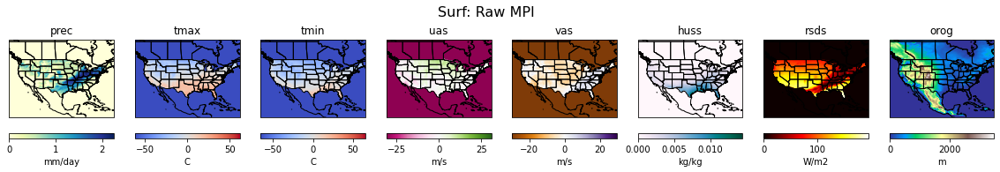

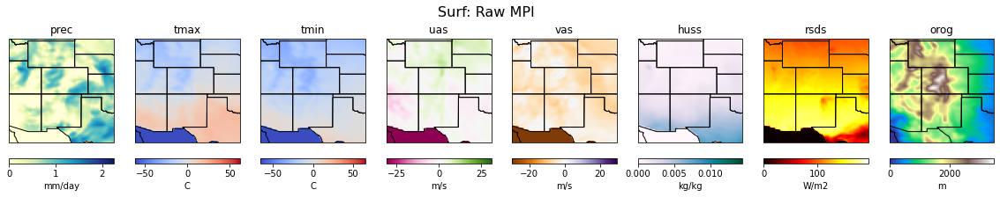

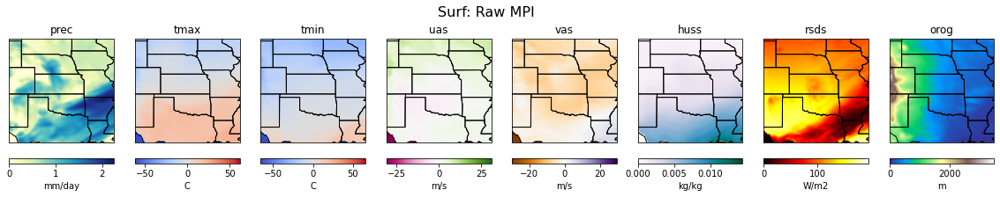

In [164]:
vmin = [raw_mpi[ii].min() for ii in range(18)]
vmax = [raw_mpi[ii].max() for ii in range(18)]
vmin[16] = 0; vmin[17] = 0
vmax[16] = 1; vmax[17] = 1

svars = [8,9,10,11,12,13,14,15]
plot_8v_abs_surf_192x256(np.array(raw_mpi), 'Surf: Raw MPI', vmin, vmax, svars=svars, cc=False)
plot_8v_abs_surf_192x256(np.array(raw_mpi), 'Surf: Raw MPI', vmin, vmax, svars=svars, xoff=64, yoff=64)
plot_8v_abs_surf_192x256(np.array(raw_mpi)[0:18, 64:64+64, 96:96+64], 'Surf: Raw MPI', vmin, vmax, svars=svars, xoff=96, yoff=64)



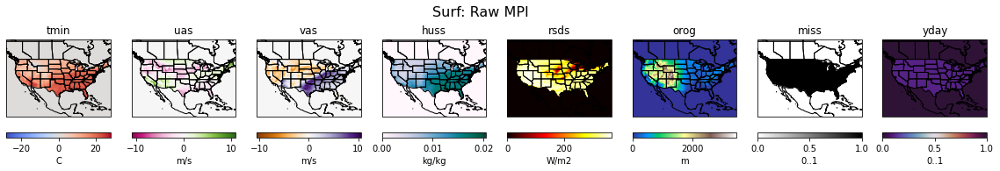

In [20]:
vmin = [raw_mpi[ii].min() for ii in range(18)]
vmax = [raw_mpi[ii].max() for ii in range(18)]
vmin[16] = 0; vmin[17] = 0
vmax[16] = 1; vmax[17] = 1

svars = [10,11,12,13,14,15,16,17]
plot_8v_abs_surf_192x256(np.array(raw_mpi), 'Surf: Raw MPI', vmin, vmax, svars=svars, cc=False)


# Experiments

In [18]:
input_era = samples_era[0:1] 
input_mpi = samples_mpi[0:1] 


In [19]:
samples_era.shape, samples_mpi.shape

(torch.Size([365, 18, 192, 256]), torch.Size([365, 18, 192, 256]))

In [20]:
samples_mpi.shape

torch.Size([365, 18, 192, 256])

### patch reconstruciton

### Tile smoothing

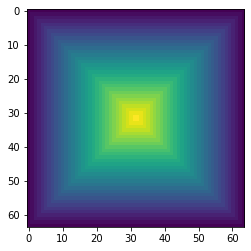

In [83]:
# Kernel#2: Flat-middle kernel
ck = np.zeros((64,64))
for jj in range(64):
    for ii in range(64):
        ck[jj,ii] = min(jj, 63-jj, ii, 63-ii) + 1 # 1 is smallest on border
plt.imshow(ck)

In [84]:
samples_mpi.shape

torch.Size([365, 18, 192, 256])

In [85]:
# normalizer / divisor mask
dm = np.zeros((192,256))
for yy in list(range(0, 192-64, 8))+[192-64]:
    for xx in list(range(0, 256-64, 8))+[256-64]:
        #print(yy,yy+64, xx,xx+64)
        dm[yy:yy+64, xx:xx+64] += ck[:,:]

## replace 0's with 1's (usually on border)
#dm[np.where(ck128==0)] = 1

In [86]:
raw_mpi.shape

(18, 192, 256)

In [87]:
ba = gen_a.encode(input_chunk)[0]
ba.shape

torch.Size([1, 512, 8, 8])

In [88]:
# for ii in range(512):
#     print(ii)
#     plt.imshow(ba[0,ii].detach().numpy() )
#     plt.show()

In [89]:
# run 64x64 patch model, sweeping domain with 8 pixel steps
generated_img = np.zeros((1, 18, 192, 256))
for yy in list(range(0, 192-64, 8))+[192-64]:
    for xx in list(range(0, 256-64, 8))+[256-64]:
        print(yy,yy+64, xx,xx+64)        
        input_chunk = samples_mpi[0:1, :,yy:yy+64,xx:xx+64]
        generated_chunk = gen_a.decode(gen_a.encode(input_chunk).detach()[0]).detach()
        generated_img[:, :, yy:yy+64, xx:xx+64] +=  np.multiply(generated_chunk[:,0:18,:,:].detach().numpy() , ck[:,:]) 
         
generated_img = np.divide(generated_img,dm[None,None,:,:])
generated_img = generated_img * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_img = generated_img[0]



0 64 0 64
0 64 8 72
0 64 16 80
0 64 24 88
0 64 32 96
0 64 40 104
0 64 48 112
0 64 56 120
0 64 64 128
0 64 72 136
0 64 80 144
0 64 88 152
0 64 96 160
0 64 104 168
0 64 112 176
0 64 120 184
0 64 128 192
0 64 136 200
0 64 144 208
0 64 152 216
0 64 160 224
0 64 168 232
0 64 176 240
0 64 184 248
0 64 192 256
8 72 0 64
8 72 8 72
8 72 16 80
8 72 24 88
8 72 32 96
8 72 40 104
8 72 48 112
8 72 56 120
8 72 64 128
8 72 72 136
8 72 80 144
8 72 88 152
8 72 96 160
8 72 104 168
8 72 112 176
8 72 120 184
8 72 128 192
8 72 136 200
8 72 144 208
8 72 152 216
8 72 160 224
8 72 168 232
8 72 176 240
8 72 184 248
8 72 192 256
16 80 0 64
16 80 8 72
16 80 16 80
16 80 24 88
16 80 32 96
16 80 40 104
16 80 48 112
16 80 56 120
16 80 64 128
16 80 72 136
16 80 80 144
16 80 88 152
16 80 96 160
16 80 104 168
16 80 112 176
16 80 120 184
16 80 128 192
16 80 136 200
16 80 144 208
16 80 152 216
16 80 160 224
16 80 168 232
16 80 176 240
16 80 184 248
16 80 192 256
24 88 0 64
24 88 8 72
24 88 16 80
24 88 24 88
24 88 32 96
24

In [90]:
#generated_img[:,12:12+128,69:69+128].shape
generated_img.shape

(18, 192, 256)

[-11.361129287067342, -21.458021862045825, 0.00024506348790980626, 245.20290351614403, 2629.891113461883, 5071.2502279432665, -10.465316431365409, -61.59768547640306] [19.59566409929903, 26.37376199930077, 0.011119882200270392, 282.0116048441332, 3136.541498149585, 5824.763751822349, 69.68058732986174, 29.914162391265563]


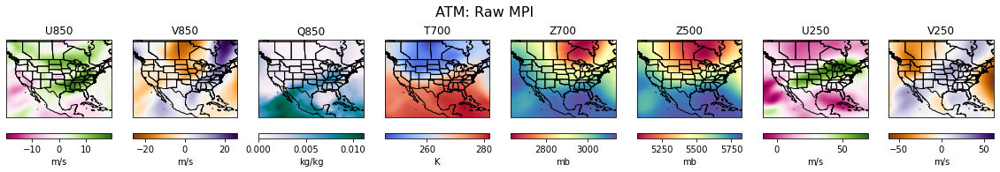

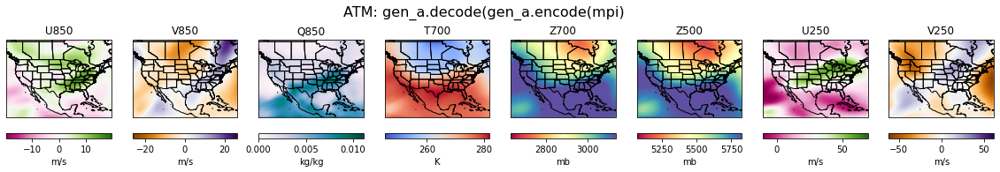

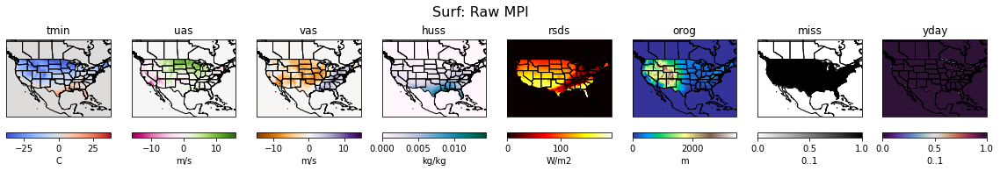

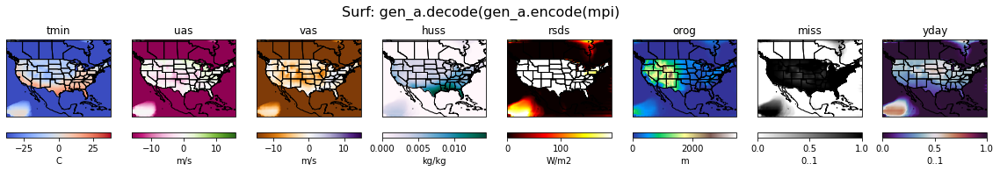

In [91]:
# raw mpi
input_img_denorm = day_input * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
raw_mpi = np.array(input_img_denorm)[0]
raw_mpi[np.isnan(raw_mpi)] = 0.   # extended surface domain has nan's at bottom
raw_mpi[8:] = (raw_mpi * mask)[8:]
vmin = [raw_mpi[ii].min() for ii in range(18)]
vmax = [raw_mpi[ii].max() for ii in range(18)]
vmin[16] = 0; vmin[17] = 0
vmax[16] = 1; vmax[17] = 1


print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs_192x256(raw_mpi, 'ATM: Raw MPI', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_192x256(generated_img, 'ATM: gen_a.decode(gen_a.encode(mpi)', vmin[0:0+8], vmax[0:0+8], cc=False)

svars = [10,11,12,13,14,15,16,17]
plot_8v_abs_surf_192x256(raw_mpi, 'Surf: Raw MPI', vmin, vmax, svars=svars, cc=False)
plot_8v_abs_surf_192x256(generated_img, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, svars=svars, cc=False)


### Simple tiling

In [28]:
#gen_a.train()
#gen_a.eval()


In [119]:
# TODO: do 2x3 maybe 2x4 tiles (each 64x64)  (2022-09-15)
# also update plot routines plot_8v_abs(), etc


generated_img2 = np.zeros((1, 18, 192, 256))

day_input = samples_mpi[0:1]
#day_input = samples_mpi[180:181]

for jj in range(3):
    for kk in range(4): 
        input_chunk = day_input[:, :, jj*64:jj*64+64, kk*64:kk*64+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        generated_chunk = gen_a.decode(gen_a.encode(input_chunk)[0]).detach()
        print(jj, kk, generated_chunk.min(), generated_chunk.max())
        generated_img2[:, :, jj*64:jj*64+64, kk*64:kk*64+64] = generated_chunk[:,0:18,:,:].detach().numpy()


generated_img2 = generated_img2 * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_img2 = generated_img2[0]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  del sys.path[0]


0 0 tensor(-0.0642) tensor(1.0740)
0 1 tensor(-0.0510) tensor(1.0391)
0 2 tensor(-0.0619) tensor(1.0477)
0 3 tensor(-0.0711) tensor(1.0350)
1 0 tensor(-0.0382) tensor(1.0107)
1 1 tensor(-0.0565) tensor(1.0417)
1 2 tensor(-0.0548) tensor(1.0425)
1 3 tensor(-0.0689) tensor(1.0255)
2 0 tensor(-0.0746) tensor(1.0142)
2 1 tensor(-0.0288) tensor(1.0063)
2 2 tensor(-0.0710) tensor(1.0334)
2 3 tensor(-0.2308) tensor(1.0353)


In [120]:
raw_mpi.shape, generated_img2.shape

((18, 192, 256), (18, 192, 256))

[-11.361129287067342, -21.458021862045825, 0.00024506348790980626, 245.20290351614403, 2629.891113461883, 5071.2502279432665, -10.465316431365409, -61.59768547640306] [19.59566409929903, 26.37376199930077, 0.011119882200270392, 282.0116048441332, 3136.541498149585, 5824.763751822349, 69.68058732986174, 29.914162391265563]


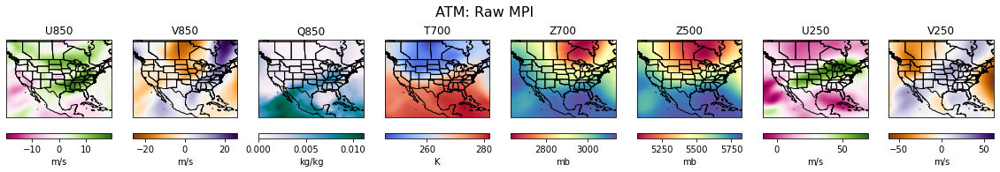

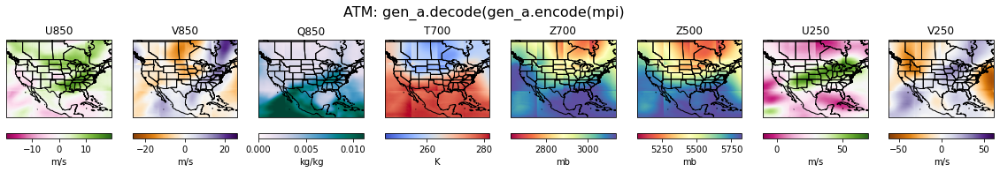

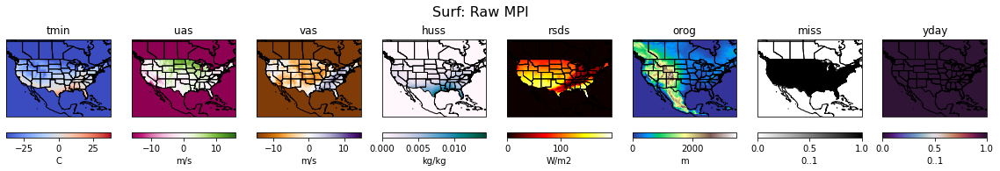

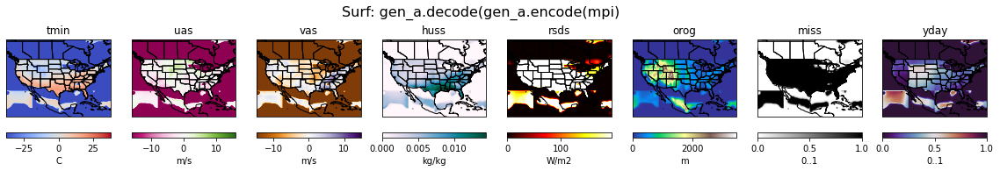

In [121]:
# raw mpi w/ mask (better for finding min/max values)
input_img_denorm = day_input * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
raw_mpi = np.array(input_img_denorm)[0]
raw_mpi[np.isnan(raw_mpi)] = 0.   # extended surface domain has nan's at bottom
raw_mpi[8:] = (raw_mpi * mask)[8:]
vmin = [raw_mpi[ii].min() for ii in range(18)]
vmax = [raw_mpi[ii].max() for ii in range(18)]
vmin[16] = 0; vmin[17] = 0
vmax[16] = 1; vmax[17] = 1

# mpi without the masking
raw_mpi = np.array(input_img_denorm)[0]
raw_mpi[np.isnan(raw_mpi)] = 0.   # extended surface domain has nan's at bottom



print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs_192x256(raw_mpi, 'ATM: Raw MPI', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_192x256(generated_img2, 'ATM: gen_a.decode(gen_a.encode(mpi)', vmin[0:0+8], vmax[0:0+8], cc=False)

svars = [10,11,12,13,14,15,16,17]
plot_8v_abs_surf_192x256(raw_mpi, 'Surf: Raw MPI', vmin, vmax, svars=svars, cc=False)
plot_8v_abs_surf_192x256(generated_img2, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, svars=svars, cc=False)


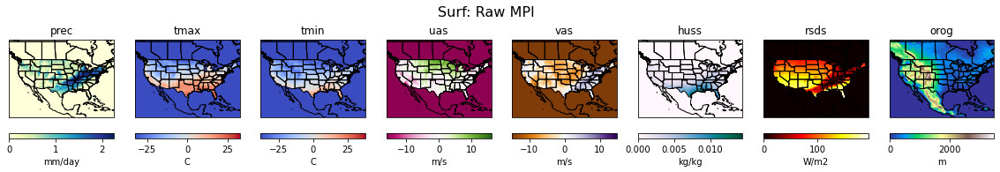

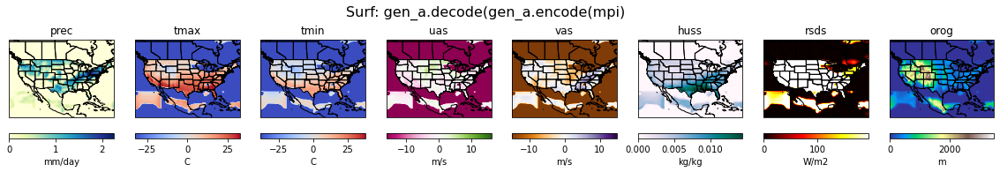

In [122]:
svars = [8,9,10,11,12,13,14,15]
plot_8v_abs_surf_192x256(raw_mpi, 'Surf: Raw MPI', vmin, vmax, svars=svars, cc=False)
plot_8v_abs_surf_192x256(generated_img2, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, svars=svars, cc=False)


In [138]:
# difference between smoothing and tiling
generated_img3 = generated_img2 - generated_img[:,12:12+128,69:69+128]

vmin = [generated_img3[ii].min() for ii in range(16)]
vmax = [generated_img3[ii].max() for ii in range(16)]

print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs(generated_img3, 'ATM: gen_a.decode(gen_a.encode(mpi)', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_surf(generated_img3, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, cc=False)


NameError: name 'generated_img' is not defined

[-28.221630490279495, -555.733999192762, -0.13751361685617855, -766.9849194933663, -1290.652775318973, -923.299457228044, -278.98168973602515, -304.91023076675265] [45.58549631726464, 20.37810605483719, 0.007682012730706228, 17.448499219819496, 444.17028314351774, 14378.493149902904, 611.133232418596, 218.7023489480489]


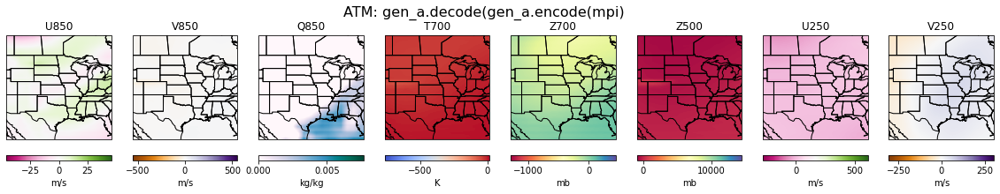

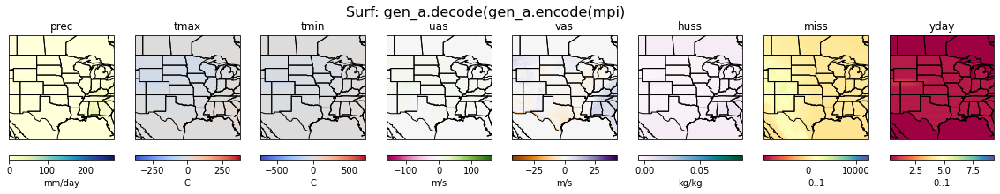

In [300]:
# raw_mpi - 8x8tiling
generated_img3 = raw_mpi - generated_img[:,12:12+128,69:69+128]

# vmin = [generated_img3[ii].min() for ii in range(16)]
# vmax = [generated_img3[ii].max() for ii in range(16)]

print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs(generated_img3, 'ATM: gen_a.decode(gen_a.encode(mpi)', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_surf(generated_img3, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, cc=False)


[-28.221630490279495, -555.733999192762, -0.13751361685617855, -766.9849194933663, -1290.652775318973, -923.299457228044, -278.98168973602515, -304.91023076675265] [45.58549631726464, 20.37810605483719, 0.007682012730706228, 17.448499219819496, 444.17028314351774, 14378.493149902904, 611.133232418596, 218.7023489480489]


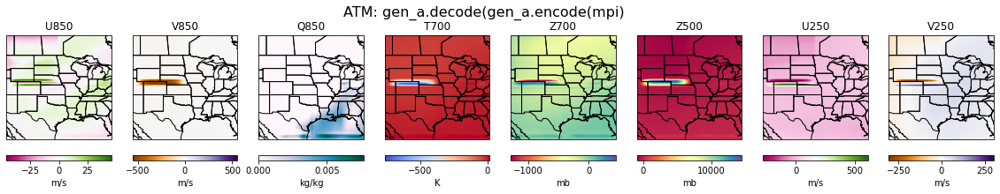

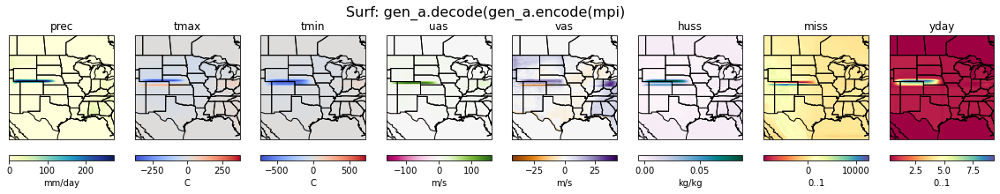

In [299]:
# raw_mpi - 4 tiles
generated_img3 = raw_mpi - generated_img2

vmin = [generated_img3[ii].min() for ii in range(16)]
vmax = [generated_img3[ii].max() for ii in range(16)]

print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs(generated_img3, 'ATM: gen_a.decode(gen_a.encode(mpi)', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_surf(generated_img3, 'Surf: gen_a.decode(gen_a.encode(mpi)', vmin, vmax, cc=False)


# Bottleneck analysis

In [22]:
# TODO: do 2x3 maybe 2x4 tiles (each 64x64)  (2022-09-15)
# also update plot routines plot_8v_abs(), etc


generated_img2 = np.zeros((1, 18, 192, 256))

day_input = samples_mpi[0:1]
#day_input = samples_mpi[180:181]

for jj in range(1,2):
    for kk in range(1,2): 
        input_chunk = day_input[:, :, jj*64:jj*64+64, kk*64:kk*64+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
 
        encoded = gen_a.encode(input_chunk)[0].detach()
        generated_chunk = gen_a.decode(encoded).detach()
        print(jj, kk, encoded.shape, generated_chunk.min(), generated_chunk.max())
        generated_img2[:, :, jj*64:jj*64+64, kk*64:kk*64+64] = generated_chunk[:,0:18,:,:].detach().numpy()



/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  del sys.path[0]


1 1 torch.Size([1, 512, 8, 8]) tensor(-0.0247) tensor(1.0290)


In [23]:
samples_mpi.shape

torch.Size([365, 18, 192, 256])

In [49]:
jj,kk

(1, 1)

### Calculate baseline: avg of activations over 1 year

In [143]:
# MPI bottleneck mean 
bn_mean_mpi = None
for ii in range(0, 365):
    #input_chunk = samples_mpi[ii:ii+1, :, jj*64:jj*64+64, kk*64:kk*64+64]
    #input_chunk = samples_mpi[ii:ii+1, :, 64:64+64, 96:96+64]
    input_chunk = samples_mpi[ii:ii+1, :, 64:64+64, 64:64+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    encoded = gen_a.encode(input_chunk)[0].detach()
    if bn_mean_mpi != None:
        bn_mean_mpi += encoded
    else:
        bn_mean_mpi = encoded
bn_mean_mpi /= 365
bn_mean_mpi.shape


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


torch.Size([1, 512, 8, 8])

In [144]:
# ERA bottleneck mean 
bn_mean_era = None
for ii in range(0, 365):    
    #input_chunk = samples_era[ii:ii+1, :, jj*64:jj*64+64, kk*64:kk*64+64]
    #input_chunk = samples_era[ii:ii+1, :, 64:64+64, 96:96+64]
    input_chunk = samples_era[ii:ii+1, :, 64:64+64, 64:64+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    encoded = gen_b.encode(input_chunk)[0].detach()
    if bn_mean_era != None:
        bn_mean_era += encoded
    else:
        bn_mean_era = encoded
bn_mean_era /= 365
bn_mean_era.shape


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


torch.Size([1, 512, 8, 8])

### find most active filters

In [55]:
y = []
filterids = set()

jj = 1; kk = 1
for ii in range(0, 365):
    #input_era = samples_era[ii:ii+mb] 
    
    #input_chunk = samples_mpi[ii:ii+1, :, jj*64:jj*64+64, kk*64:kk*64+64]
    input_chunk = samples_mpi[ii:ii+1, :, 64:64+64, 96:96+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    encoded = gen_a.encode(input_chunk)[0].detach()

    #print(ii, input_mpi.shape)
    diff = encoded - bn_mean_mpi
    #print(ii, diff.max(), np.where(diff==diff.max()))
    yy = int(np.where(diff==diff.max())[1])
    y.append(yy)
    filterids.add(yy)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  # Remove the CWD from sys.path while we load stuff.


In [56]:
print(sorted(filterids)), y

[41, 47, 54, 56, 70, 73, 89, 93, 143, 151, 154, 161, 234, 250, 257, 258, 308, 313, 323, 346, 412, 415, 419, 436, 438, 446, 497, 498, 503, 505, 507, 510, 511]


(None,
 [323,
  497,
  497,
  323,
  250,
  412,
  308,
  511,
  346,
  346,
  346,
  497,
  497,
  507,
  497,
  497,
  250,
  507,
  507,
  507,
  498,
  308,
  497,
  497,
  412,
  308,
  498,
  497,
  507,
  70,
  308,
  70,
  503,
  346,
  346,
  346,
  507,
  308,
  47,
  498,
  412,
  498,
  498,
  70,
  498,
  498,
  47,
  234,
  503,
  497,
  161,
  412,
  498,
  498,
  497,
  497,
  415,
  323,
  419,
  308,
  308,
  323,
  511,
  346,
  346,
  313,
  507,
  47,
  308,
  308,
  308,
  415,
  505,
  323,
  497,
  412,
  308,
  308,
  308,
  412,
  505,
  419,
  412,
  505,
  346,
  346,
  308,
  323,
  47,
  47,
  497,
  313,
  313,
  313,
  313,
  346,
  412,
  323,
  323,
  412,
  497,
  498,
  412,
  436,
  323,
  308,
  498,
  498,
  497,
  412,
  323,
  346,
  436,
  412,
  436,
  412,
  412,
  419,
  503,
  412,
  47,
  346,
  41,
  412,
  412,
  412,
  498,
  419,
  503,
  346,
  346,
  346,
  436,
  323,
  503,
  250,
  161,
  510,
  419,
  323,
  412,
  412,
  250,
  

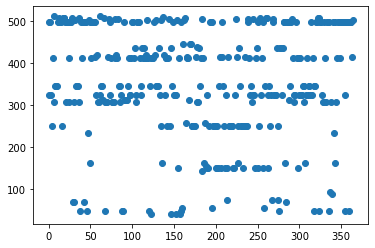

In [57]:
plt.scatter(range(len(y)), y)


In [58]:
# input: filterids
yd = {}
for fid in filterids:
    yd[fid] = []
    
jj=1; kk=1
for ii in range(0, 365):
    input_chunk = samples_mpi[ii:ii+1, :, 64:64+64, 96:96+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    encoded = gen_a.encode(input_chunk)[0].detach()

    diff = encoded - bn_mean_mpi   
    for fid in filterids:
        ## max
        #mv = float(diff[0,fid].max())
        
        # sum
        mv = float(diff[0,fid].abs().sum())
        
        #print(ii, fid, mv)
        yd[fid].append(mv)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  if __name__ == '__main__':


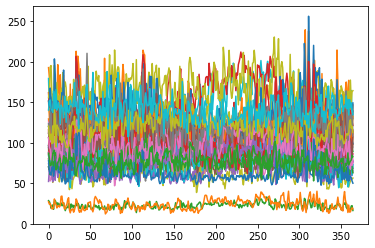

In [59]:
for fid in sorted(filterids):
    #plt.scatter(range(len(yd[fid])), yd[fid], s=5)
    plt.plot(range(len(yd[fid])), yd[fid])


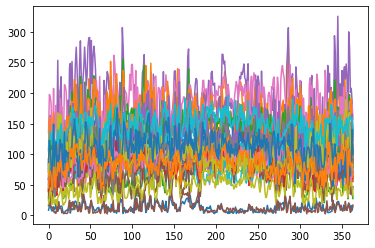

In [207]:
for fid in sorted(filterids):
    #plt.scatter(range(len(yd[fid])), yd[fid], s=5)
    plt.plot(range(len(yd[fid])), yd[fid])


In [ ]:
# fnum= 30

# tile plot
for ii in range(200, 207):
    input_mpi = samples_mpi[ii:ii+1] 
    #if ii==0:
    vmin = [input_mpi[0,ii].min() for ii in range(16)]
    vmax = [input_mpi[0,ii].max() for ii in range(16)]

    print(ii, diff[0,5,:].detach().numpy())

    plot_8v_abs(input_mpi[0].detach().numpy(), 'ATM: Day {}'.format(ii), vmin[0:0+8], vmax[0:0+8], cc=False)
    plot_8v_abs_surf(input_mpi[0].detach().numpy(), 'Surf: Day {}'.format(ii), vmin, vmax, cc=False)
        
    AB = general_encoder(input_mpi)
    diff = AB - AB_baseline
    plt.imshow(diff[0,fnum,:].detach().numpy()[::-1,:])
    plt.show()


### decode average of activations

In [154]:
generated_chunk = gen_a.decode(encoded).detach().numpy()
print(jj, kk, generated_chunk.min(), generated_chunk.max())
generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_chunk = generated_chunk[0]


2 3 -0.07407544 1.0456271


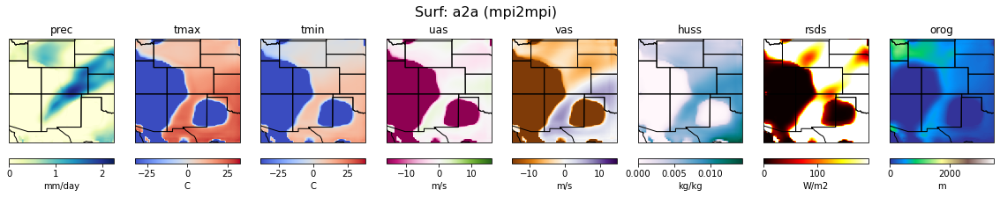

(18, 64, 64)


In [155]:
svars=[8,9,10,11,12,13,14,15]
#plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=96, yoff=64)
plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
print(np.array(generated_chunk).shape)


2 3 -0.40639645 1.1307395


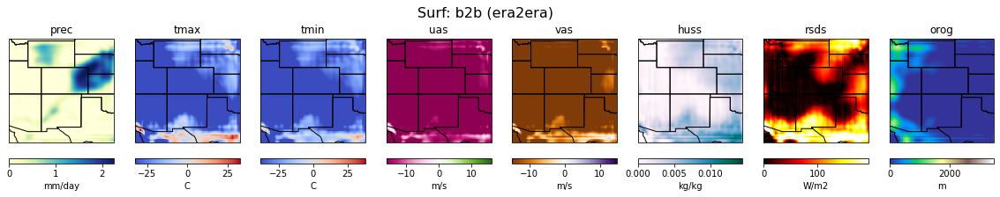

In [156]:
generated_chunk = gen_a.decode(encoded).detach().numpy()
print(jj, kk, generated_chunk.min(), generated_chunk.max())
generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_chunk = generated_chunk[0]
plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: b2b (era2era)', vmin, vmax, svars=svars, xoff=64, yoff=64)


### Extreme data

In [181]:
ii = 222
#day_input = samples_mpi[261:262] # interesting day with front
#day_input = samples_mpi[222:223] # interesting day with front

input_chunk = samples_mpi[ii:ii+1, :, 64:64+64, 64:64+64]
input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
encoded = gen_a.encode(input_chunk)[0].detach()




/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


In [182]:
# avg_decoded
generated_chunk = gen_a.decode(bn_mean_mpi).detach().numpy()
generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_chunk = generated_chunk[0]
avg_decoded = generated_chunk

# front_decoded
generated_chunk = gen_a.decode(encoded).detach().numpy()
generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
generated_chunk = generated_chunk[0]
front_decoded = generated_chunk


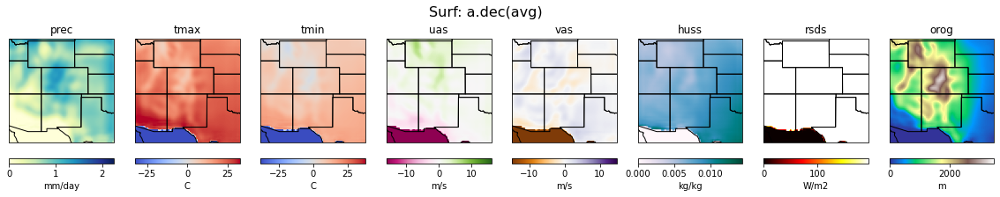

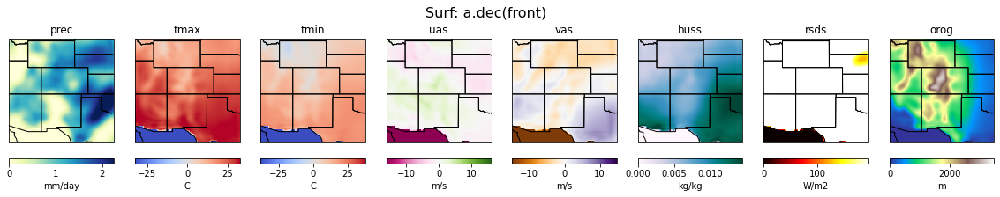

In [162]:
svars=[8,9,10,11,12,13,14,15]
plot_8v_abs_surf_192x256(np.array(avg_decoded), 'Surf: a.dec(avg)', vmin, vmax, svars=svars, xoff=64, yoff=64)
plot_8v_abs_surf_192x256(np.array(front_decoded), 'Surf: a.dec(front)', vmin, vmax, svars=svars, xoff=64, yoff=64)
    

In [191]:
NN = 365
err1_list = []   # deviation from bottle neck mean
err2_list = []
for ff in range(NN):
    print(ff)
#     fig, axarr = plt.subplots(1, 2, figsize = (10,10))
#     plot = axarr[0].imshow(encoded.detach().numpy()[0,ff,::-1,:])
#     plot = axarr[1].imshow((encoded.detach().numpy()-bn_mean_mpi.numpy())[0,ff,::-1,:])
#     plt.show()
    
    # col3
    newbn = encoded.clone()
    newbn[0,ff,:,:] = bn_mean_mpi[0,ff,:,:].clone()
    generated_chunk = gen_a.decode(newbn).detach().numpy()
    generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk = generated_chunk[0]
    err = float(mse(torch.tensor(generated_chunk), torch.tensor(front_decoded)).detach())
    print('avg err', err)
    #err1_list.append([err, [ff, generated_chunk.copy()]])
    err1_list.append([err, [ff, generated_chunk - front_decoded]])
    svars=[8,9,10,11,12,13,14,15]
    #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
    
    
    # col4
    newbn = bn_mean_mpi.clone()
    newbn[0,ff,:,:] = encoded[0,ff,:,:].clone()
    generated_chunk = gen_a.decode(newbn).detach().numpy()
    generated_chunk = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk = generated_chunk[0]
    err = float(mse(torch.tensor(generated_chunk), torch.tensor(avg_decoded)).detach())
    print('front err', err)
    #err2_list.append([err, [ff, generated_chunk.copy()]])
    err2_list.append([err, [ff, generated_chunk - front_decoded]])

    svars=[8,9,10,11,12,13,14,15]
    #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
                         

0
avg err 0.059490150034706354
front err 0.04085069875028077
1
avg err 0.03326790815271739
front err 0.011700219811917406
2
avg err 0.12797323104595135
front err 0.13337726473077713
3
avg err 0.0035857486353456894
front err 0.004073986091983425
4
avg err 0.07344917779478195
front err 0.10004124225690543
5
avg err 0.3798202508992652
front err 0.26573484760056143
6
avg err 2.2446833973191875
front err 1.968204182991817
7
avg err 0.10523047661810549
front err 0.0870785144003541
8
avg err 0.271302181268338
front err 0.11297281235437436
9
avg err 0.04395473720236843
front err 0.04540392923111166
10
avg err 0.07566267554591684
front err 0.07623446414226548
11
avg err 0.03306180433175213
front err 0.04366757005561962
12
avg err 0.30418541618765205
front err 0.26835583969211674
13
avg err 0.004274051476649482
front err 0.00410094633870578
14
avg err 0.00967010659830526
front err 0.009299239258178214
15
avg err 3.1178966146660296
front err 2.445328992712293
16
avg err 0.4772149470254944
front e

avg err 0.4549325034590636
front err 0.281602186820164
136
avg err 1.2199033580474354
front err 1.3668471906779023
137
avg err 0.041215679035659224
front err 0.02258382801194749
138
avg err 0.12200349403307781
front err 0.09863159875681797
139
avg err 0.061033726586277176
front err 0.05232870420668374
140
avg err 0.05891427759640602
front err 0.07357871575981884
141
avg err 0.02237745162845892
front err 0.019575099137667144
142
avg err 0.059759163366951605
front err 0.04788206259735291
143
avg err 0.34054693751852905
front err 0.18968895845844663
144
avg err 0.07346387444099797
front err 0.06705096639330245
145
avg err 0.3974524511105867
front err 0.15056594513398278
146
avg err 0.0022410182672779554
front err 0.0021111810837950995
147
avg err 0.008294111789958333
front err 0.005986972019322004
148
avg err 0.125970205952482
front err 0.09452428648089167
149
avg err 0.005073748640494337
front err 0.005298619044152749
150
avg err 0.5109342798589329
front err 0.6186595221426416
151
avg er

front err 0.047571430005473946
268
avg err 6.685677918101689
front err 6.001989399439946
269
avg err 0.06866695920909388
front err 0.06844060873749352
270
avg err 0.005951757938042886
front err 0.005848264213137445
271
avg err 0.03108071959736421
front err 0.03838011685662173
272
avg err 0.02475560090147402
front err 0.030624303415337284
273
avg err 0.21994049769814386
front err 0.2730866184404532
274
avg err 0.0698141999114539
front err 0.08670146050239803
275
avg err 0.007974792153892046
front err 0.006600006907778365
276
avg err 0.15510712637635027
front err 0.19334478351521334
277
avg err 0.009324557719598297
front err 0.008381299004050513
278
avg err 0.10663518470744979
front err 0.0705959076322048
279
avg err 0.17733335643417117
front err 0.1294607201483495
280
avg err 0.0012863639254866027
front err 0.001642811594038306
281
avg err 0.01498340755167151
front err 0.0173558044077841
282
avg err 0.053148105444703254
front err 0.030626037601741547
283
avg err 0.06279261188062528
fron

13.648798012521944 151


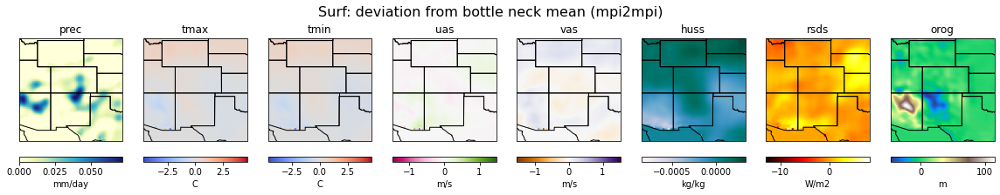

7.5300563750532445 100


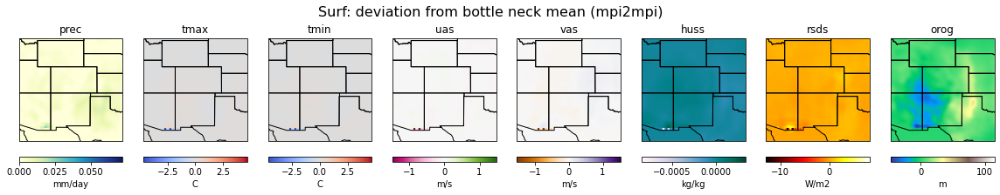

6.685677918101689 268


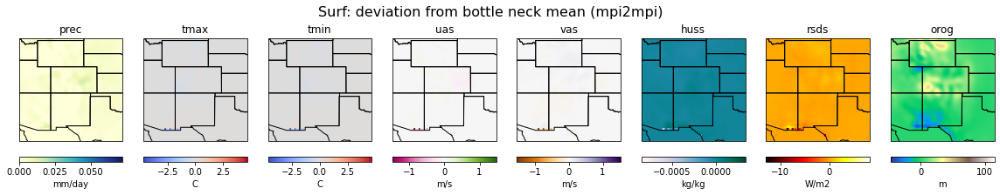

5.799364044751272 250


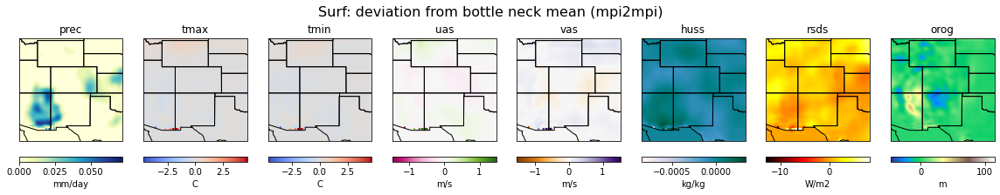

5.332213120935503 323


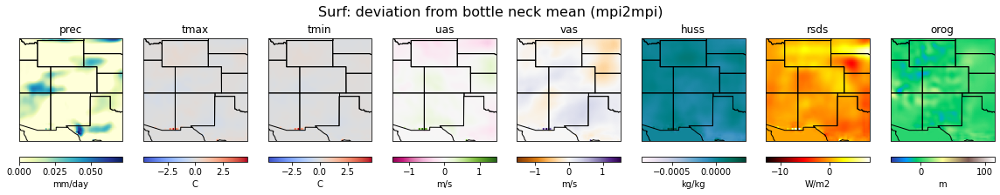

4.986048432390934 163


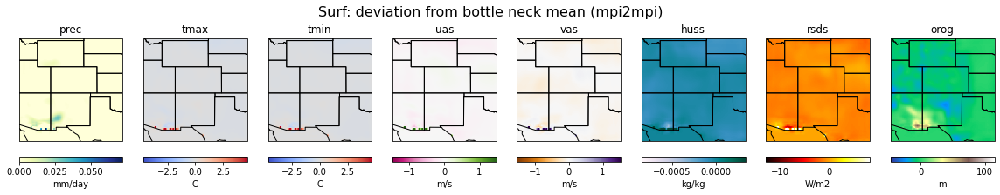

4.253936188118051 309


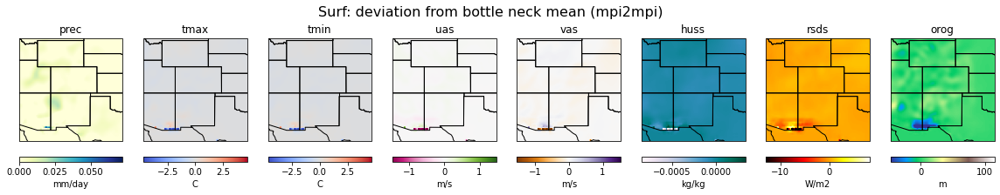

4.1093785039108885 36


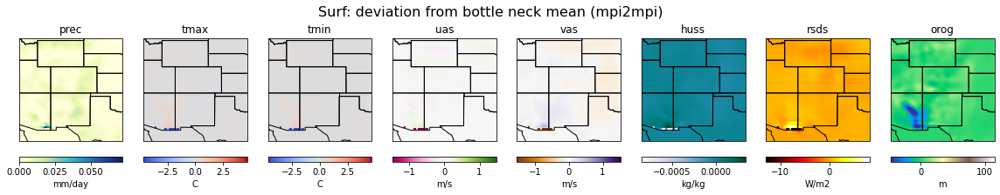

4.084345010030964 355


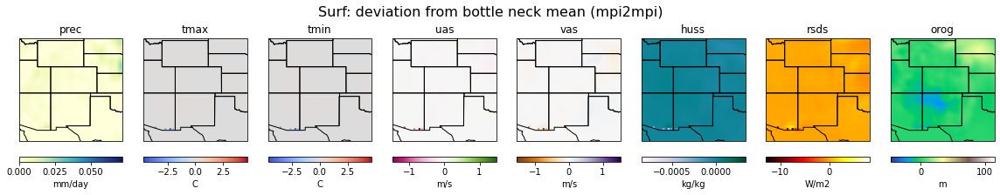

4.082332717155319 231


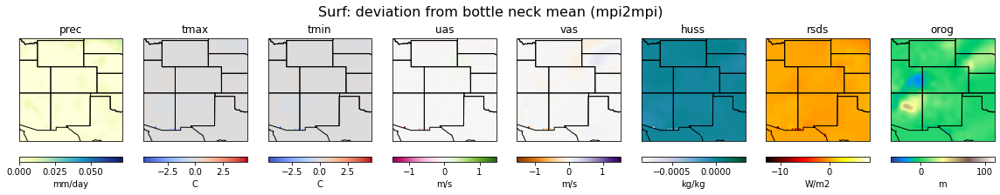

3.600551694595125 239


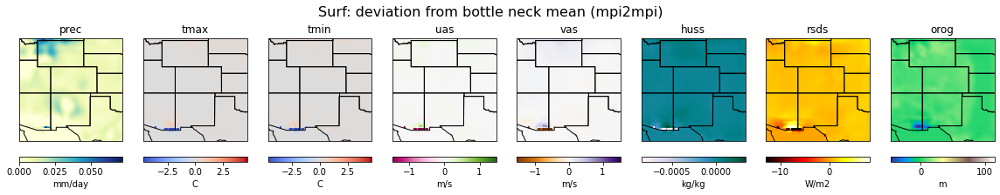

3.1178966146660296 15


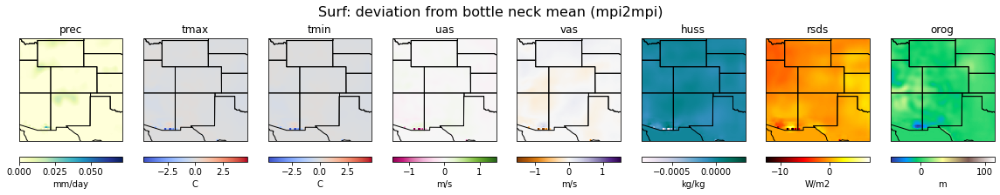

2.9115339541423553 114


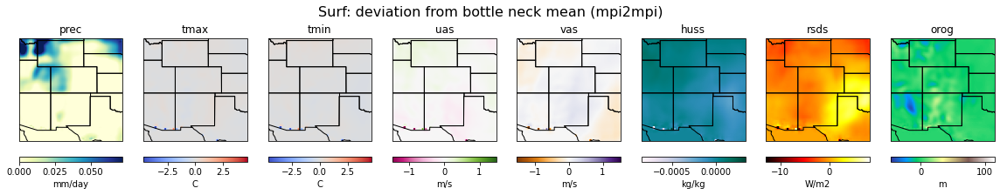

2.6768111600532296 325


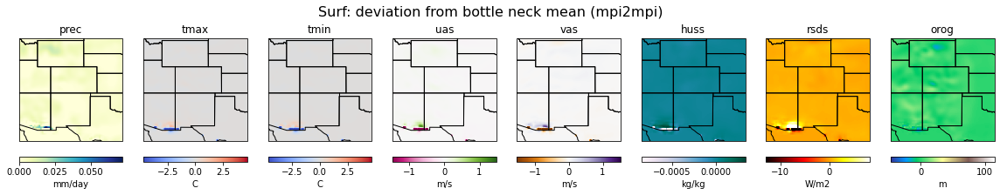

2.503678085546202 346


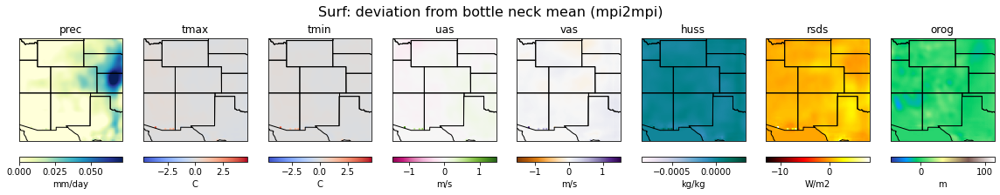

2.402647891229316 91


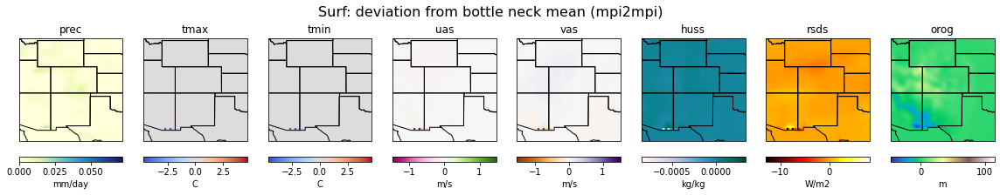

2.345579106879238 111


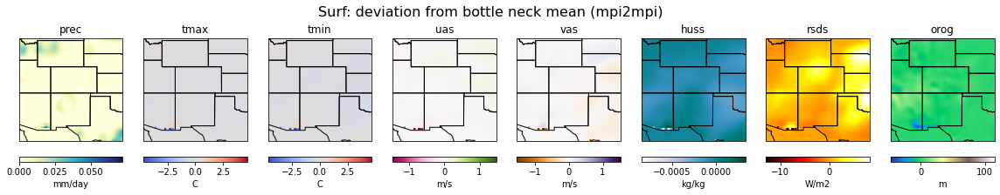

2.2446833973191875 6


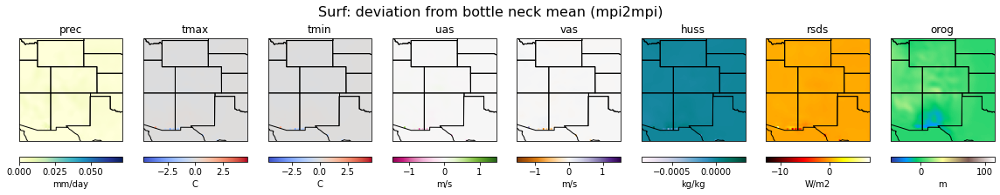

2.2426156743677637 156


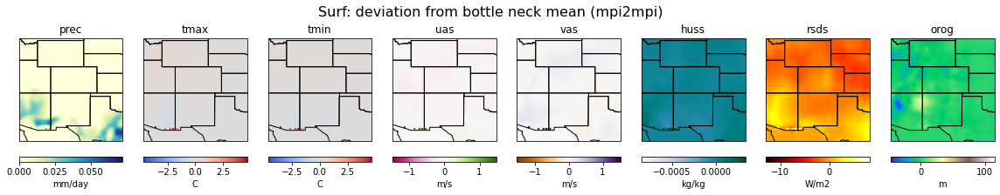

2.218313860469095 331


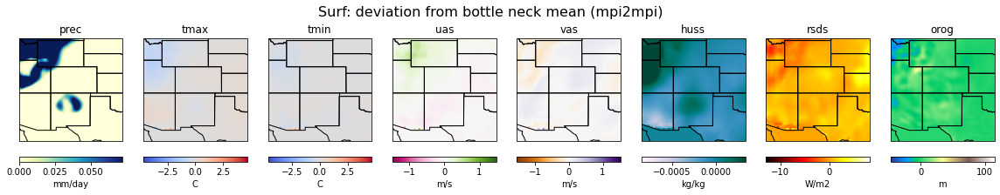

2.0837378558683017 356


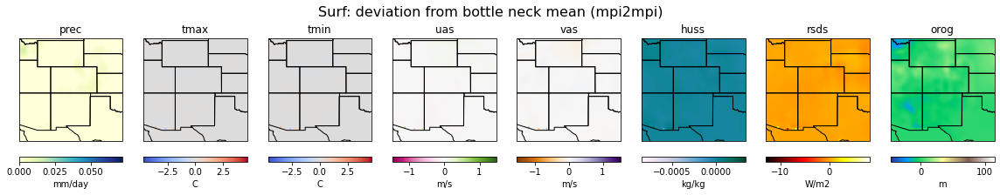

2.0380782945356524 39


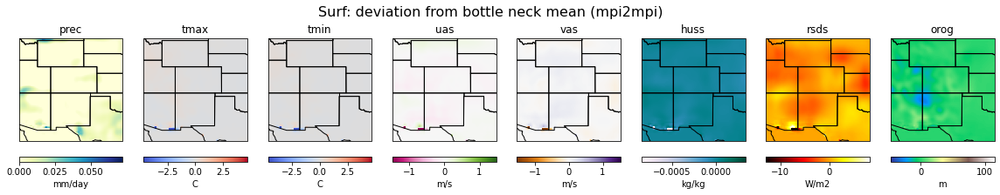

2.0364245379547112 222


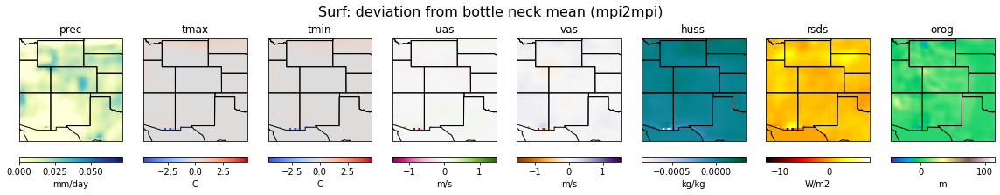

1.9498016546364119 56


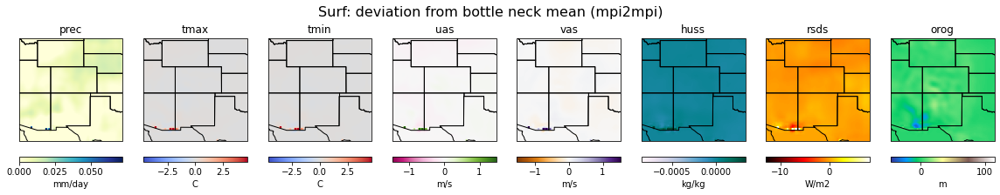

1.9260971875999608 41


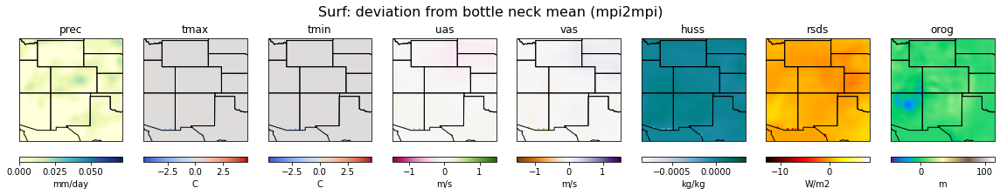

1.8848308314810274 130


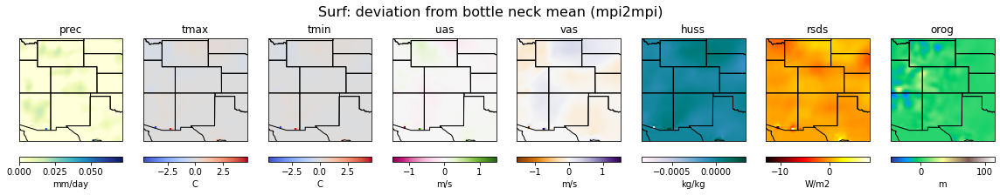

1.7359871884090905 313


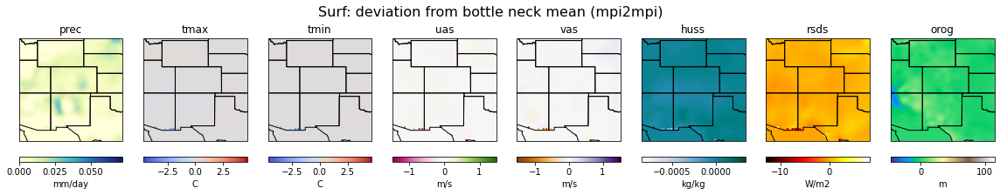

1.73148312526025 72


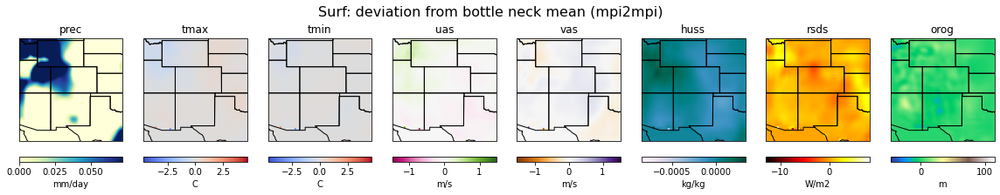

1.7179303114477018 193


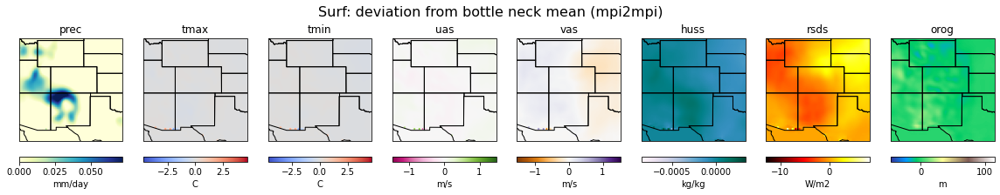

1.7127352568188492 201


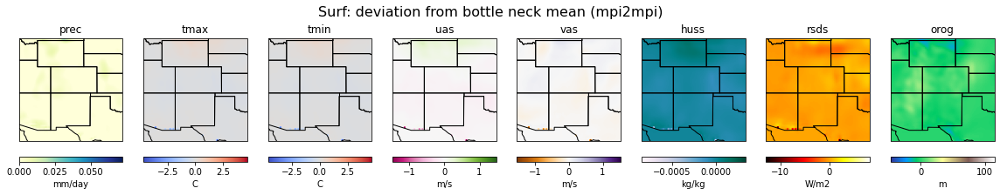

In [203]:
ii = 0
# vmin = [raw_mpi[ii].min() for ii in range(18)]
# vmax = [raw_mpi[ii].max() for ii in range(18)]
# vmin[16] = 0; vmin[17] = 0
# vmax[16] = 1; vmax[17] = 1

for xx in sorted(err1_list, reverse=True):
    if ii == 0:
        vmin = [xx[1][1][ii].min() for ii in range(18)]
        vmax = [xx[1][1][ii].max() for ii in range(18)]

    print(xx[0], xx[1][0])
    svars=[8,9,10,11,12,13,14,15]
    plot_8v_abs_surf_192x256(xx[1][1], 'Surf: deviation from bottle neck mean (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)

    ii += 1
    if ii >= 30:
        break



In [180]:
3

3

6.001989399439946 268


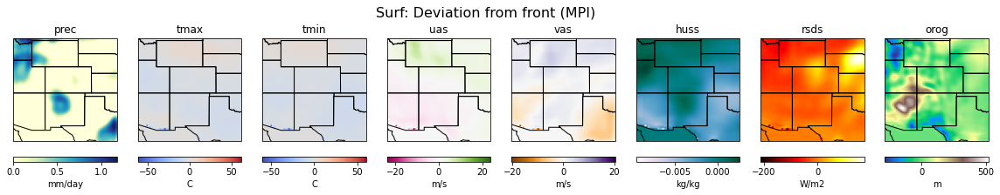

5.51165064267761 100


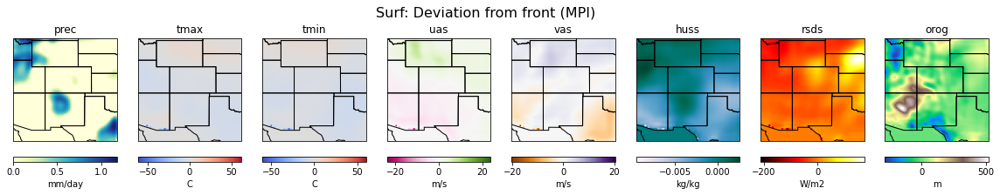

4.510669799665459 323


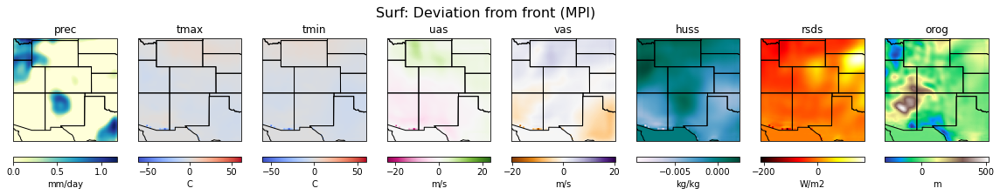

3.9944786234717338 36


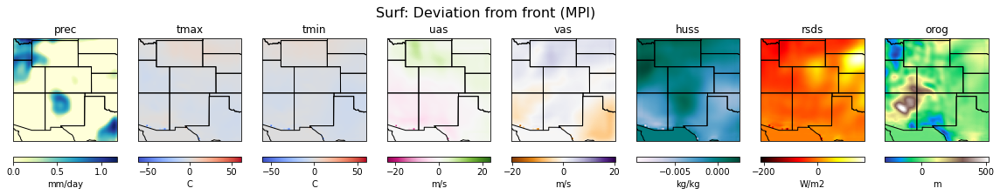

3.6292327882551714 250


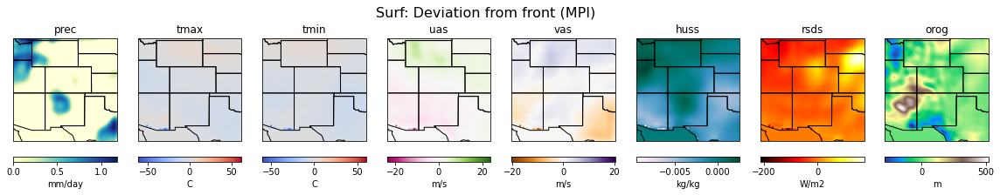

3.4726301431158766 151


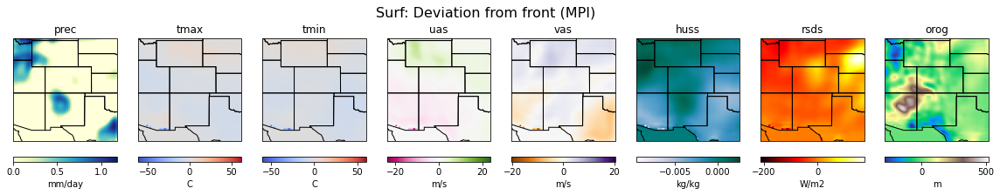

3.37871866293288 114


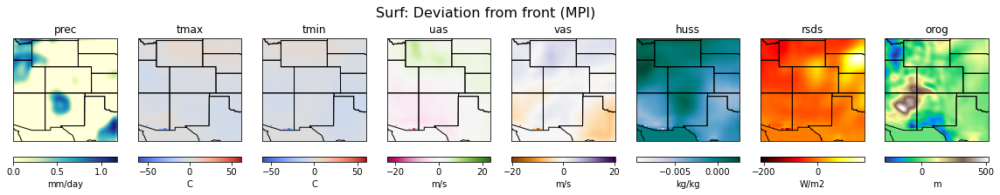

3.3454010948541657 309


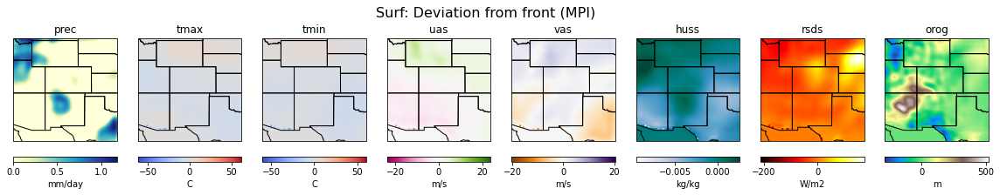

3.180611547077324 355


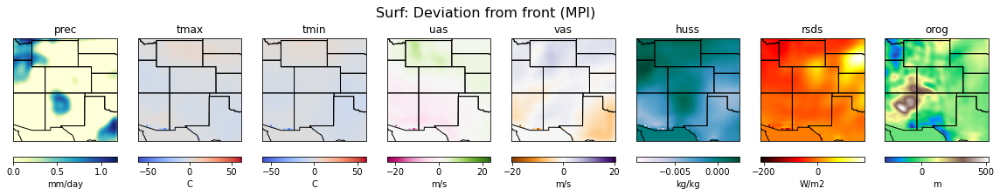

3.103377023615509 239


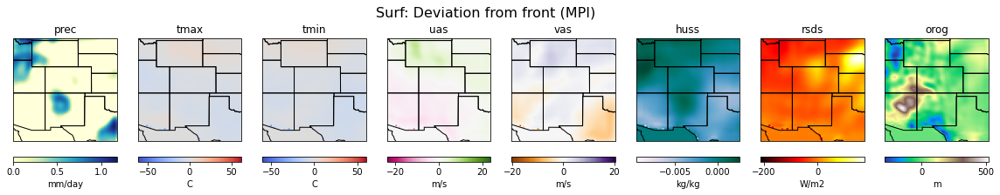

2.9260661818385336 313


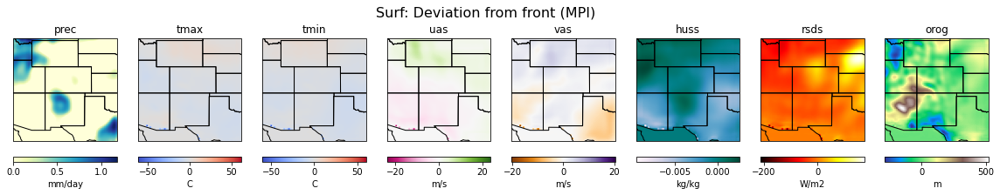

2.9097812101423806 231


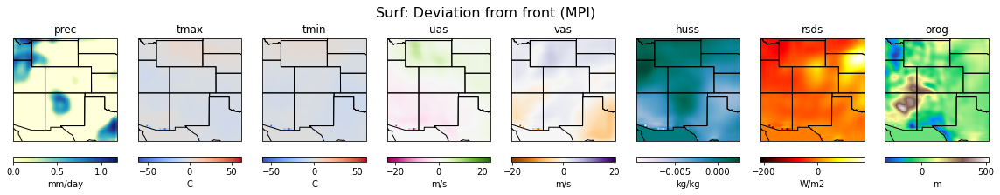

2.7435031413128734 346


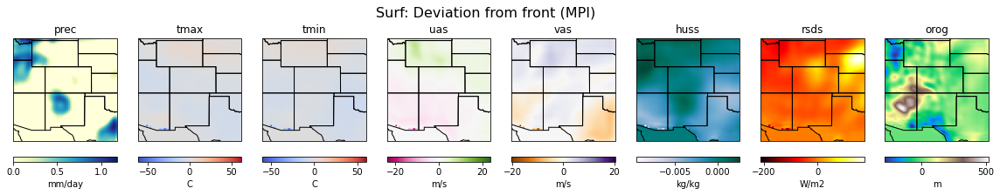

2.7401505653223865 331


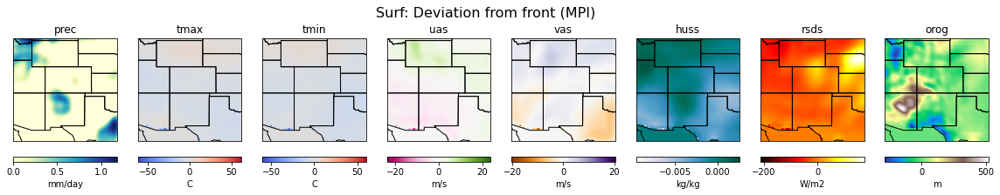

2.6873239379872036 163


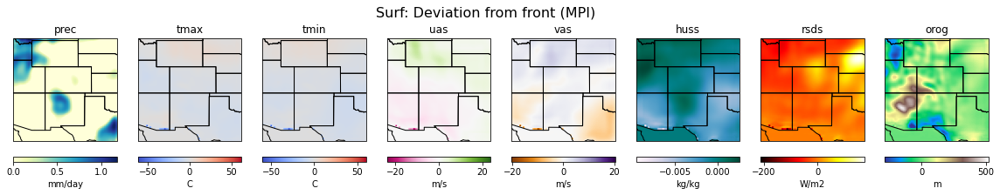

2.445328992712293 15


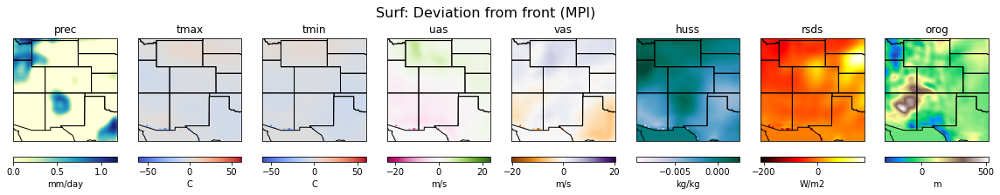

2.426230995784368 222


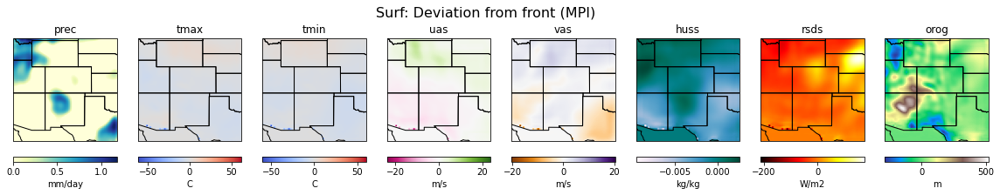

2.4221868427339106 325


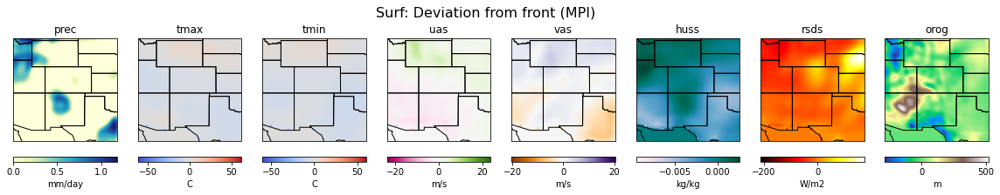

2.341363300648927 156


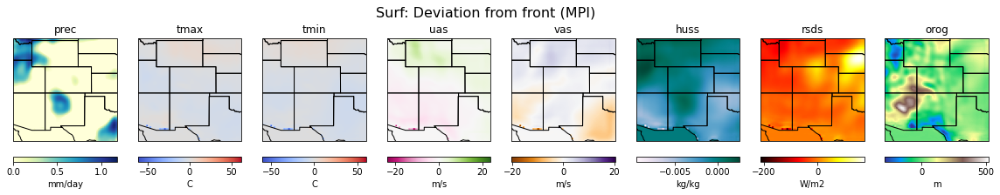

2.031599469864249 254


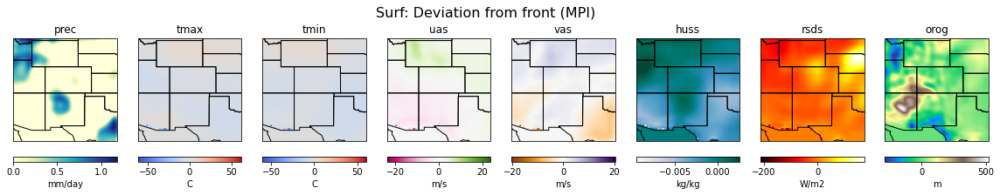

2.0262386755889006 39


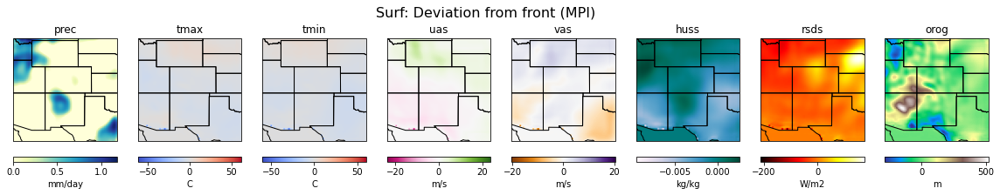

1.968204182991817 6


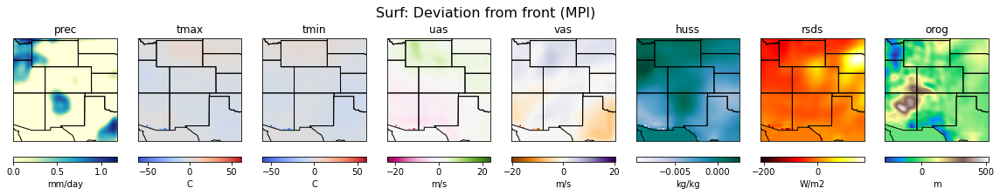

1.8231881832973953 111


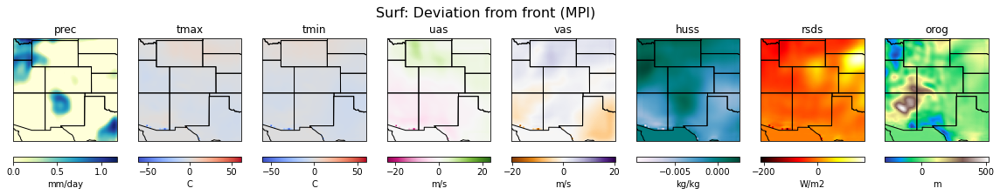

1.774013114798991 105


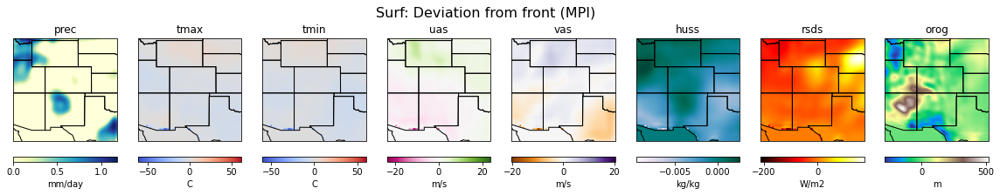

1.7281459037450508 193


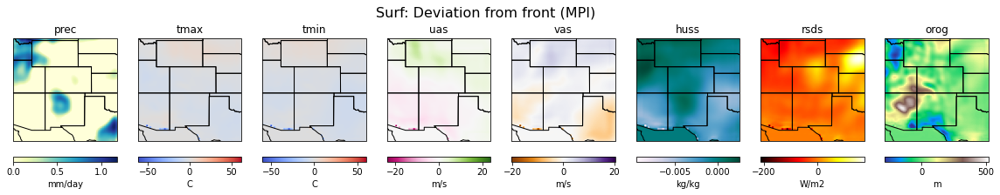

1.7179729966292667 356


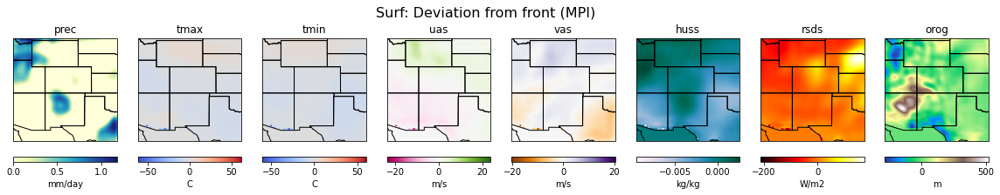

1.675482312241028 113


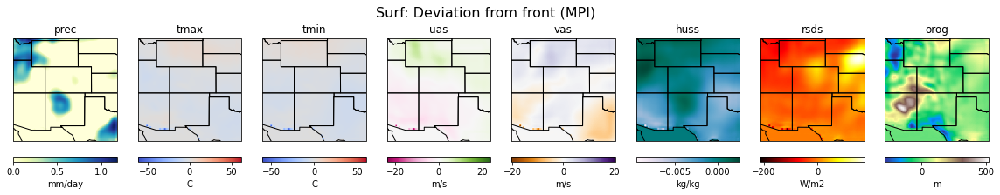

1.628177911570433 56


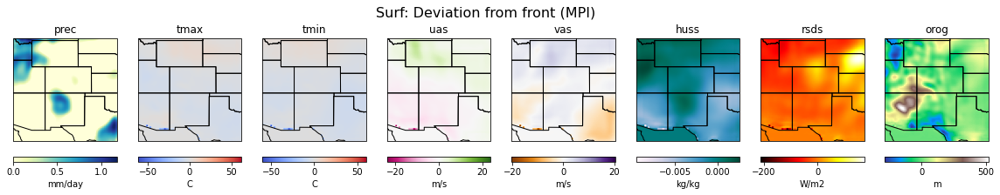

1.5878703956206068 130


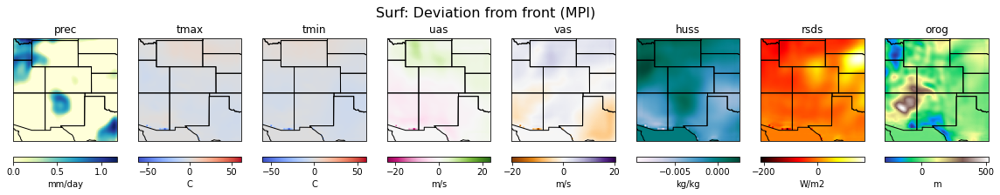

1.5469593557835033 91


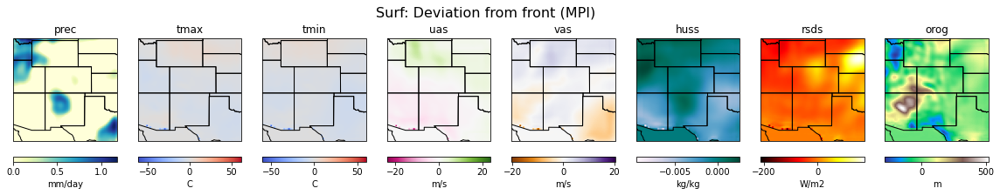

In [204]:
ii = 0
for xx in sorted(err2_list, reverse=True):
    if ii == 0:
        vmin = [xx[1][1][ii].min() for ii in range(18)]
        vmax = [xx[1][1][ii].max() for ii in range(18)]

    print(xx[0], xx[1][0])
    svars=[8,9,10,11,12,13,14,15]
    plot_8v_abs_surf_192x256(xx[1][1], 'Surf: Deviation from front (MPI)', vmin, vmax, svars=svars, xoff=64, yoff=64)
    ii += 1
    if ii >= 30:
        break
    

In [140]:
mse(torch.tensor(avg_decoded),torch.tensor(avg_decoded))


tensor(0., dtype=torch.float64)